# Bibliotecas, Leitura e Setup

## Bibliotecas

In [4]:
# Manipulação
import pandas as pd
import numpy as np

# Visualização
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_pacf

# Feature Importance
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor

# Redução de Dimensionalidade
from sklearn.inspection import permutation_importance
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

## Setup de Funções

In [5]:
def min_max_normalize(df):
    return (df - df.min()) / (df.max() - df.min())

In [6]:
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True, figsize=(11, 4))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
)
%config InlineBackend.figure_format = 'retina'

C:\Users\Gustavo\AppData\Local\Temp\ipykernel_40392\4183850112.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-whitegrid")


## Leitura

In [7]:
# Dados de entrada
df_entrada = pd.read_csv('data/DF_TEMPERATURA_CHAMA_TG_IASMIN(Entrada).csv')
df_entrada['TEMPO'] = pd.to_datetime(df_entrada['TEMPO'], format='%d-%b-%y %H:%M:%S')
df_entrada.set_index('TEMPO', inplace=True)
df_entrada.columns = ['POTENCIA_ATIVA_GERADOR','TEMPERATURA_EXAUSTAO_T7','TEMEPERATURA_ATM',
                      'TEMPERATURA_DO_GAS_COMBUSTIVEL','VAZAO_DE_GAS_COMBUSTIVEL',
                      'H2_CROMATOGRAFO','ANALISADOR_DE_H2',
                      'H2_NORM','CO_NORM','METANO_NORM','CO2_NORM','ETILENO_NORM','ETANO_NORM',
                      'PROPANO_NORM','PROPILENO_NORM','C5+_NORM','N-BUTANO_NORM','ENXOFRE_NORM',
                      'PODER_CALORIFICO_BRUTO_EM_MASSA','PODER_CALORIFICO_LIQUIDO_EM_MASSA',
                      'PODER_CALORIFICO_BRUTO_EM_VOLUME','PODER_CALORIFICO_LIQUIDO_EM_VOLUME',
                      'FATOR_DE_SOMA','PESO_MOLECULAR','DENSIDADE','DENSIDADE_RELATIVA',
                      'INDICE_WOBBE_BRUTO','INDICE_WOBBE_LIQUIDO']
df_entrada['H2_NORM'] = df_entrada['H2_NORM'].shift(-5)
df_entrada['CO_NORM'] = df_entrada['CO_NORM'].shift(-5)
df_entrada['METANO_NORM'] = df_entrada['METANO_NORM'].shift(-5)
df_entrada['CO2_NORM'] = df_entrada['CO2_NORM'].shift(-5)
df_entrada['ETILENO_NORM'] = df_entrada['ETILENO_NORM'].shift(-5)
df_entrada['ETANO_NORM'] = df_entrada['ETANO_NORM'].shift(-5)
df_entrada['PROPANO_NORM'] = df_entrada['PROPANO_NORM'].shift(-5)
df_entrada['PROPILENO_NORM'] = df_entrada['PROPILENO_NORM'].shift(-5)
df_entrada['C5+_NORM'] = df_entrada['C5+_NORM'].shift(-5)
df_entrada['N-BUTANO_NORM'] = df_entrada['N-BUTANO_NORM'].shift(-5)
df_entrada['ENXOFRE_NORM'] = df_entrada['ENXOFRE_NORM'].shift(-5)
df_entrada = df_entrada.interpolate()

# Dados intermediários
df_intermediaria = pd.read_csv('data/DF_TEMPERATURA_CHAMA_TG_IASMIN(Intermediária).csv')
df_intermediaria = df_intermediaria.drop('COGER - GE1731 - SETPOINT BYPASS  AREA - CONTROLE EMISSAO (02MBM10DG901PV)', axis=1)
df_intermediaria['TEMPO'] = pd.to_datetime(df_intermediaria['TEMPO'], format='%d-%b-%y %H:%M:%S')
df_intermediaria.set_index('TEMPO', inplace=True)
df_intermediaria.columns = ['QUEIMADOR_1', 'QUEIMADOR_2', 'QUEIMADOR_3', 'QUEIMADOR_4', 'QUEIMADOR_5',
                            'QUEIMADOR_6', 'QUEIMADOR_7', 'QUEIMADOR_8', 'QUEIMADOR_9', 'QUEIMADOR_10',
                            'QUEIMADOR_11', 'QUEIMADOR_12', 'QUEIMADOR_13', 'QUEIMADOR_14', 'QUEIMADOR_15',
                            'QUEIMADOR_16', 'QUEIMADOR_17', 'QUEIMADOR_18', 'FATOR_DE_CARGA', 'TEMPERATURA_DA_CHAMA']
df_intermediaria = df_intermediaria.interpolate()

# Dados de saída
df_saida = pd.read_csv('data/DF_TEMPERATURA_CHAMA_TG_IASMIN(Saída).csv')
df_saida['TEMPO'] = pd.to_datetime(df_saida['TEMPO'], format='%d-%b-%y %H:%M:%S')
df_saida.set_index('TEMPO', inplace=True)
df_saida.columns = ['TEMPERATURA_MEDIA_DO_QUEIMADOR']
df_saida = df_saida.interpolate()

# Concatenação dos dataframes
df = pd.concat([df_entrada, df_intermediaria, df_saida], axis=1)
describe = df.describe().T
print('\n\033[93mHavia 7 linhas nulas, resolvidas com interpolação\033[0m')
df.info()


Havia 7 linhas nulas, resolvidas com interpolação
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 10081 entries, 2024-07-15 00:00:00 to 2024-07-22 00:00:00
Data columns (total 49 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   POTENCIA_ATIVA_GERADOR              10081 non-null  float64
 1   TEMPERATURA_EXAUSTAO_T7             10081 non-null  float64
 2   TEMEPERATURA_ATM                    10081 non-null  float64
 3   TEMPERATURA_DO_GAS_COMBUSTIVEL      10081 non-null  float64
 4   VAZAO_DE_GAS_COMBUSTIVEL            10081 non-null  float64
 5   H2_CROMATOGRAFO                     10081 non-null  float64
 6   ANALISADOR_DE_H2                    10081 non-null  float64
 7   H2_NORM                             10081 non-null  float64
 8   CO_NORM                             10081 non-null  float64
 9   METANO_NORM                         10081 non-null  float64
 10  CO2_NORM            

In [8]:
df_5seg = pd.read_csv('data/DF_MORE_TEMP(Intermediário).csv')
df_5seg = df_5seg.drop('COGER - GE1731 - SETPOINT BYPASS  AREA - CONTROLE EMISSAO (02MBM10DG901PV)', axis=1)
df_5seg['TEMPO'] = pd.to_datetime(df_5seg['TEMPO'], format='%d-%b-%y %H:%M:%S')
df_5seg.set_index('TEMPO', inplace=True)
df_5seg.columns = ['QUEIMADOR_1', 'QUEIMADOR_2', 'QUEIMADOR_3', 'QUEIMADOR_4', 'QUEIMADOR_5',
                    'QUEIMADOR_6', 'QUEIMADOR_7', 'QUEIMADOR_8', 'QUEIMADOR_9', 'QUEIMADOR_10',
                    'QUEIMADOR_11', 'QUEIMADOR_12', 'QUEIMADOR_13', 'QUEIMADOR_14', 'QUEIMADOR_15',
                    'QUEIMADOR_16', 'QUEIMADOR_17', 'QUEIMADOR_18', 'FATOR_DE_CARGA', 'TEMPERATURA_DA_CHAMA']
df_5seg = df_5seg.interpolate()
print('\n\033[93mHavia 153 linhas nulas, resolvidas com interpolação\033[0m')
df_5seg.info()


Havia 153 linhas nulas, resolvidas com interpolação
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 328321 entries, 2024-07-03 00:00:00 to 2024-07-22 00:00:00
Data columns (total 20 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   QUEIMADOR_1           328321 non-null  float64
 1   QUEIMADOR_2           328321 non-null  float64
 2   QUEIMADOR_3           328321 non-null  float64
 3   QUEIMADOR_4           328321 non-null  float64
 4   QUEIMADOR_5           328321 non-null  float64
 5   QUEIMADOR_6           328321 non-null  float64
 6   QUEIMADOR_7           328321 non-null  float64
 7   QUEIMADOR_8           328321 non-null  float64
 8   QUEIMADOR_9           328321 non-null  float64
 9   QUEIMADOR_10          328321 non-null  float64
 10  QUEIMADOR_11          328321 non-null  float64
 11  QUEIMADOR_12          328321 non-null  float64
 12  QUEIMADOR_13          328321 non-null  float64
 13  QUEIMADOR_14     

# Cortes

In [46]:
def plot_data_cut_v(start_time, end_time, df, columns, title, ylabel, cuts, cuts_names, greater=0):
    plt.figure(figsize=(15, 7))
    color_cycle = plt.cm.tab10.colors
    n_colors = len(color_cycle)
    
    for i, column in enumerate(columns):
        # Set line style based on the number of columns
        if i >= 11:
            linestyle = '--'
        else:
            linestyle = '-'
        color = color_cycle[i % n_colors]
        linewidth = 3 if i >= len(columns) - greater else 1
        plt.plot(df.loc[start_time:end_time][column], label=column, color=color, linestyle=linestyle, linewidth=linewidth)
    
    plt.title(title, fontsize=16)
    plt.xlabel('Tempo', fontsize=13)
    plt.ylabel(ylabel, fontsize=13)
    
    # Break long labels
    def break_label(label):
        parts = [label[i:i+12] for i in range(0, len(label), 12)]
        return '\n'.join(parts)
    
    legend_labels = [break_label(col) for col in columns] + cuts_names
    for i, time in enumerate(cuts):
        plt.axvline(pd.to_datetime(time), color=color_cycle[i % n_colors], linestyle='--', linewidth=2, label=cuts_names[i])

    plt.legend(legend_labels, fontsize=11, loc='upper left', bbox_to_anchor=(1, 1))
    plt.tight_layout()
    plt.savefig(f'plots/{title}.png')
    plt.show()

In [9]:
def plot_data_cut(start_time, end_time, df, columns, title, ylabel, greater=0):
    plt.figure(figsize=(15, 7))
    color_cycle = plt.cm.tab10.colors
    n_colors = len(color_cycle)
    
    for i, column in enumerate(columns):
        # Set line style based on the number of columns
        if i >= 11:
            linestyle = '--'
        else:
            linestyle = '-'
        color = color_cycle[i % n_colors]
        linewidth = 3 if i >= len(columns) - greater else 1
        plt.plot(df.loc[start_time:end_time][column], label=column, color=color, linestyle=linestyle, linewidth=linewidth)
    
    plt.title(title, fontsize=16)
    plt.xlabel('Tempo', fontsize=13)
    plt.ylabel(ylabel, fontsize=13)
    
    # Break long labels
    def break_label(label):
        parts = [label[i:i+12] for i in range(0, len(label), 12)]
        return '\n'.join(parts)
    
    legend_labels = [break_label(col) for col in columns]
    plt.legend(legend_labels, fontsize=11, loc='upper left', bbox_to_anchor=(1, 1))
    
    plt.tight_layout()
    plt.savefig(f'plots/{title}.png')
    plt.show()

## Cortes (2024-07-16 00:00:00 / 2024-07-16 00:30:00) - Normal

In [2]:
start_time1 = '2024-07-16 00:00:00'
end_time1 = '2024-07-16 00:30:00'

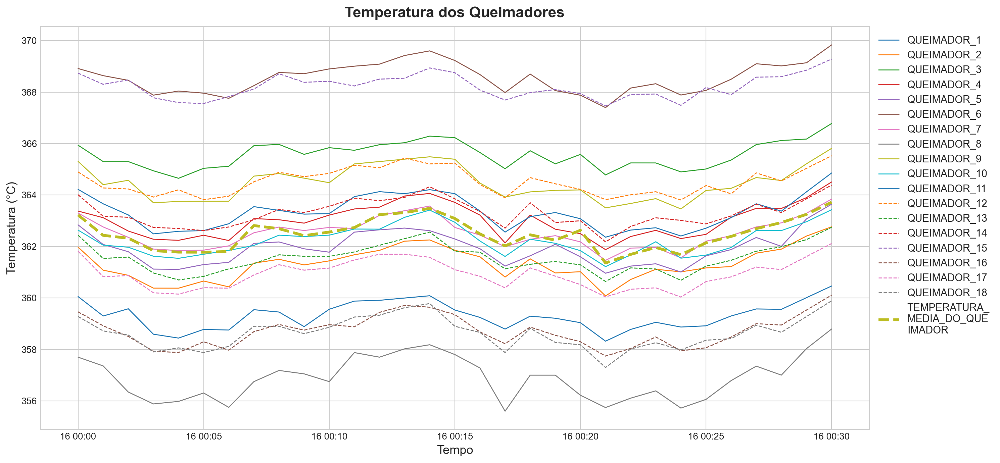

In [10]:
columns_queimadores = ['QUEIMADOR_1', 'QUEIMADOR_2', 'QUEIMADOR_3', 'QUEIMADOR_4', 'QUEIMADOR_5',
                    'QUEIMADOR_6', 'QUEIMADOR_7', 'QUEIMADOR_8', 'QUEIMADOR_9', 'QUEIMADOR_10',
                    'QUEIMADOR_11', 'QUEIMADOR_12', 'QUEIMADOR_13', 'QUEIMADOR_14', 'QUEIMADOR_15',
                    'QUEIMADOR_16', 'QUEIMADOR_17', 'QUEIMADOR_18', 'TEMPERATURA_MEDIA_DO_QUEIMADOR']
plot_data_cut(start_time1, end_time1, df, columns_queimadores, 'Temperatura dos Queimadores', 'Temperatura (°C)', greater=1)

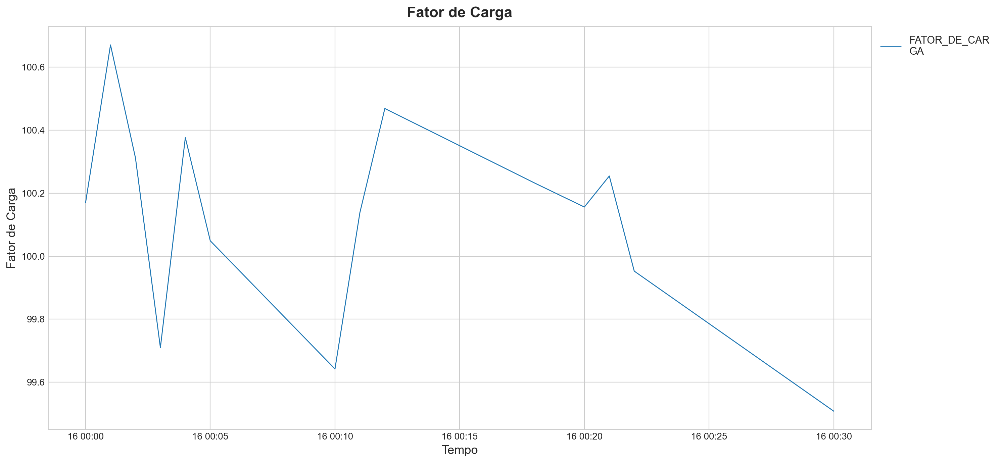

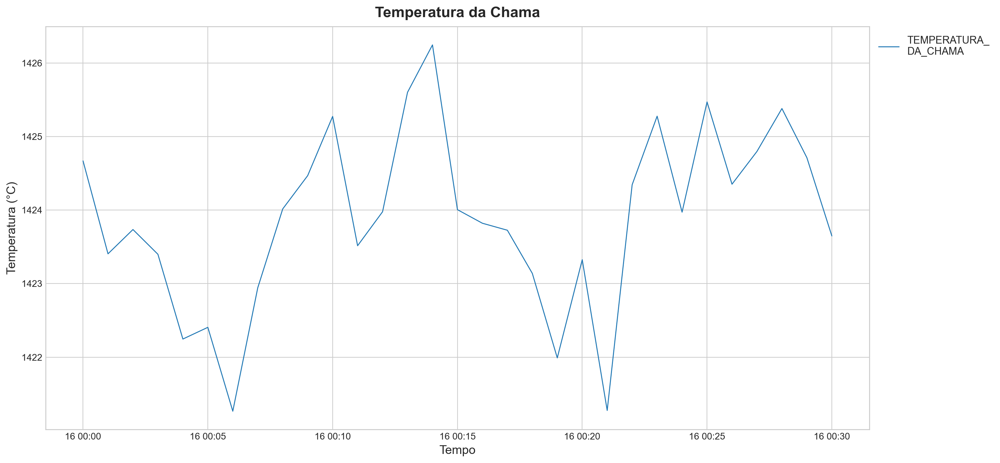

In [11]:
columns = ['FATOR_DE_CARGA', 'TEMPERATURA_DA_CHAMA']
titles = ['Fator de Carga', 'Temperatura da Chama']
ylabels = ['Fator de Carga', 'Temperatura (°C)']

for i, column in enumerate(columns):
    if isinstance(column, list):
        plot_data_cut(start_time1, end_time1, df, column, titles[i], ylabels[i], greater=0)
    else:
        plot_data_cut(start_time1, end_time1, df, [column], titles[i], ylabels[i], greater=0)

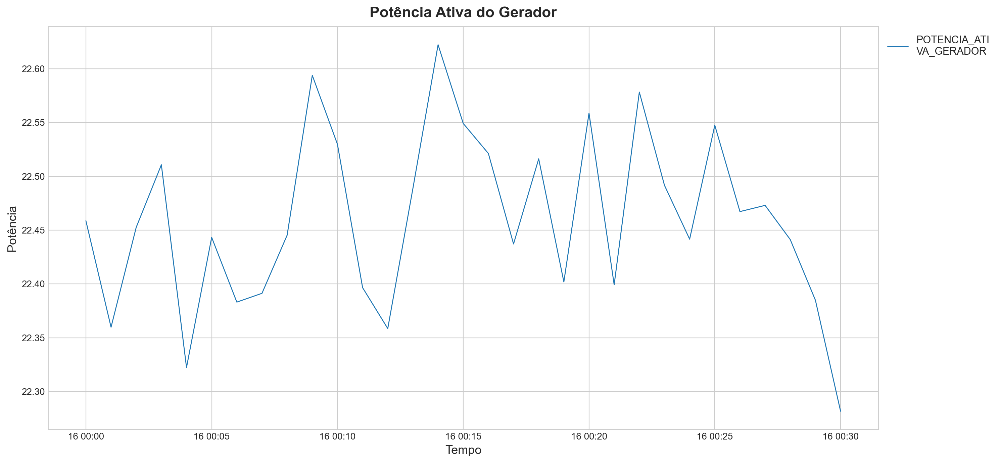

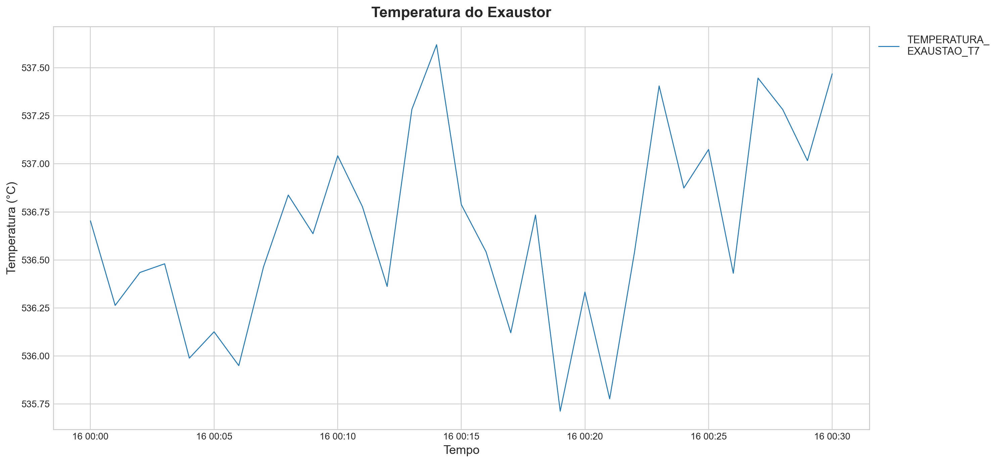

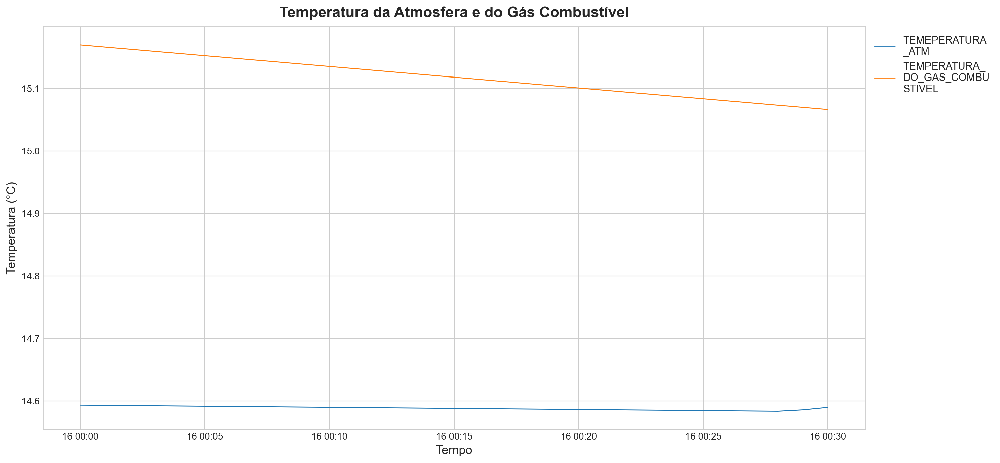

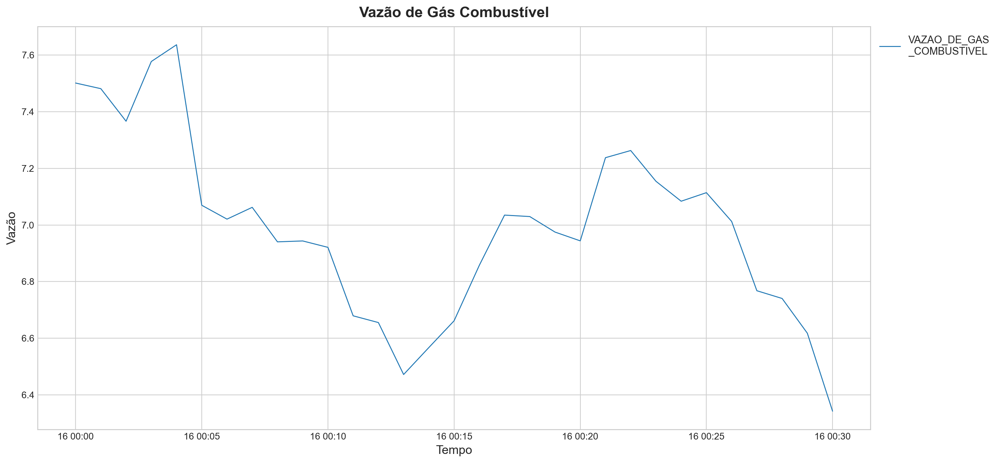

In [12]:
columns = ['POTENCIA_ATIVA_GERADOR','TEMPERATURA_EXAUSTAO_T7',['TEMEPERATURA_ATM',
            'TEMPERATURA_DO_GAS_COMBUSTIVEL'],'VAZAO_DE_GAS_COMBUSTIVEL']
titles = ['Potência Ativa do Gerador','Temperatura do Exaustor','Temperatura da Atmosfera e do Gás Combustível','Vazão de Gás Combustível']
ylabels = ['Potência','Temperatura (°C)','Temperatura (°C)','Vazão']
for i, column in enumerate(columns):
    if isinstance(column, list):
        plot_data_cut(start_time1, end_time1, df, column, titles[i], ylabels[i], greater=0)
    else:
        plot_data_cut(start_time1, end_time1, df, [column], titles[i], ylabels[i], greater=0)

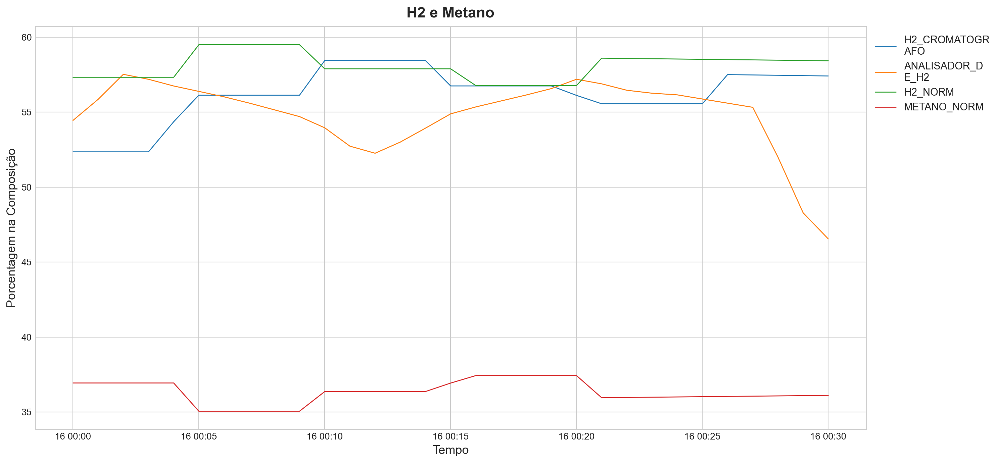

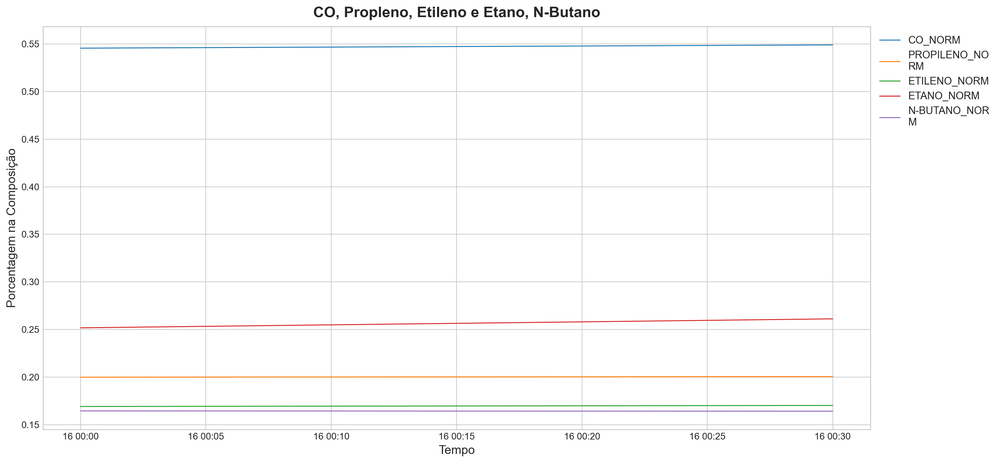

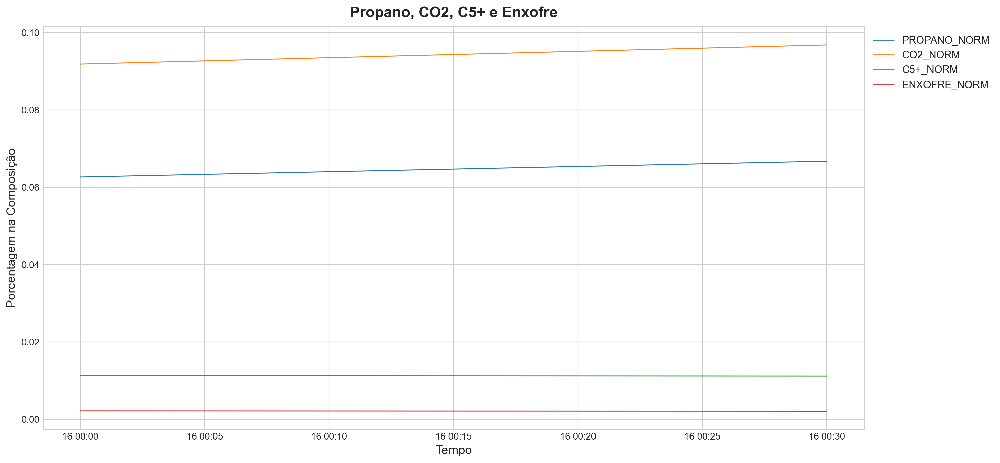

In [13]:
columns = [['H2_CROMATOGRAFO','ANALISADOR_DE_H2','H2_NORM', 'METANO_NORM'], 
           ['CO_NORM','PROPILENO_NORM','ETILENO_NORM','ETANO_NORM','N-BUTANO_NORM'],
           ['PROPANO_NORM','CO2_NORM','C5+_NORM','ENXOFRE_NORM']]
titles = ['H2 e Metano','CO, Propleno, Etileno e Etano, N-Butano','Propano, CO2, C5+ e Enxofre']
ylabels = ['Porcentagem na Composição','Porcentagem na Composição','Porcentagem na Composição']
for i, column in enumerate(columns):
    if isinstance(column, list):
        plot_data_cut(start_time1, end_time1, df, column, titles[i], ylabels[i], greater=0)
    else:
        plot_data_cut(start_time1, end_time1, df, [column], titles[i], ylabels[i], greater=0)

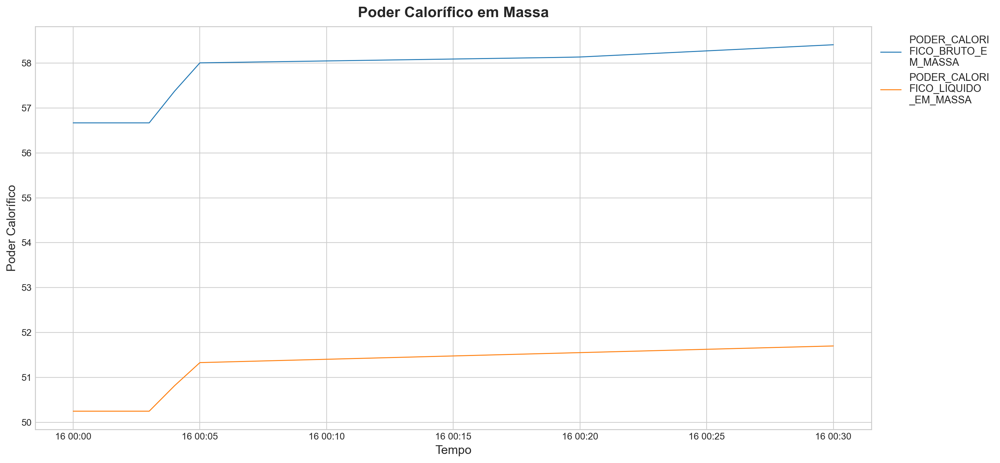

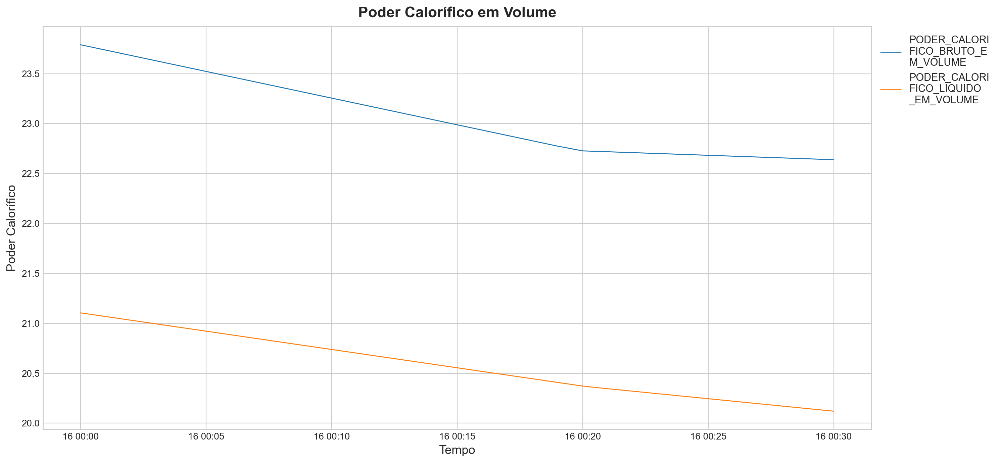

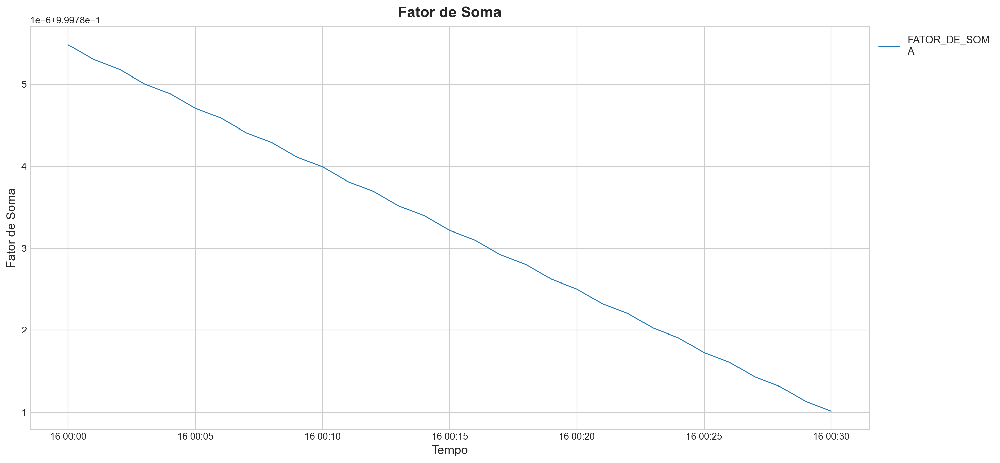

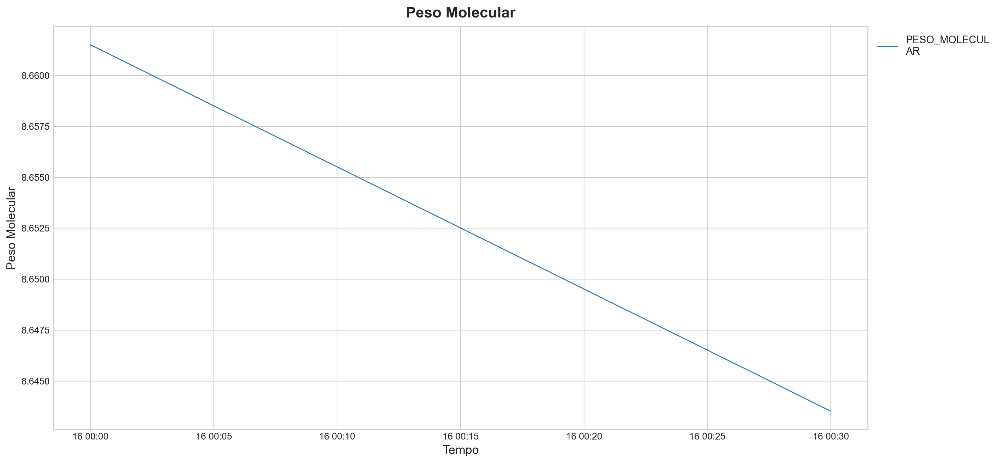

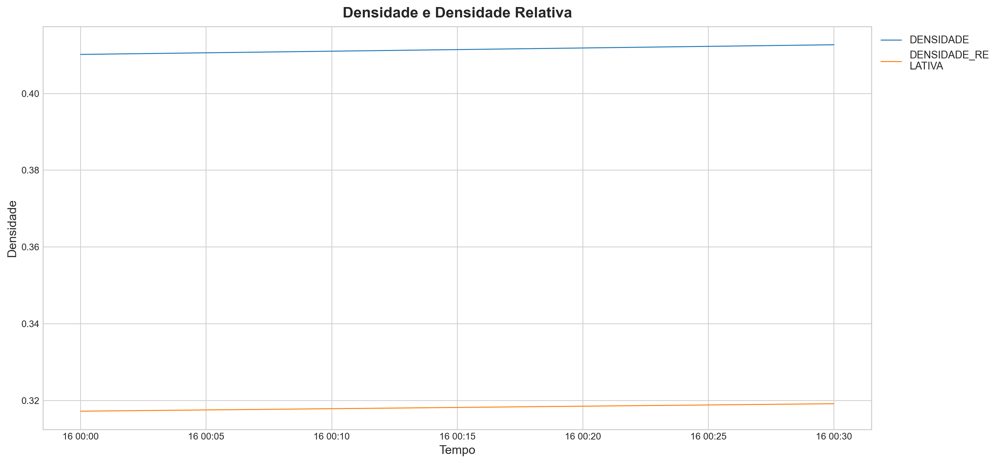

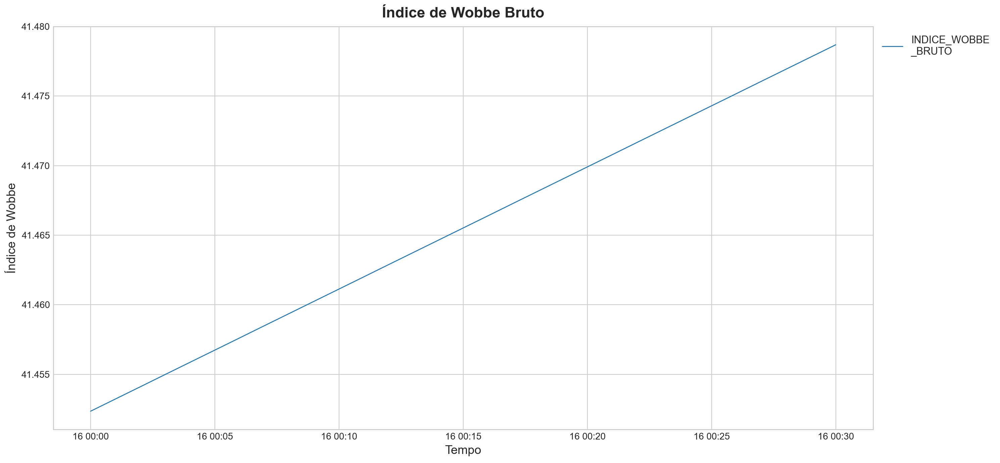

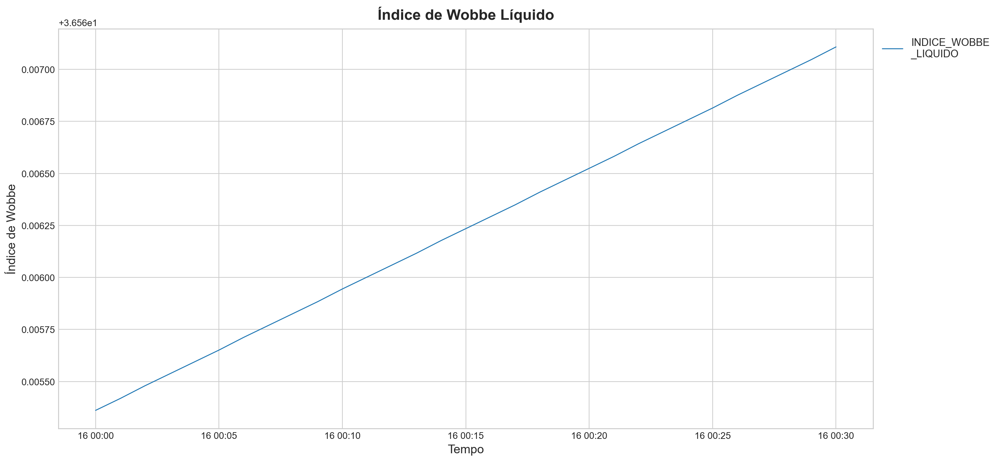

In [15]:
columns = [['PODER_CALORIFICO_BRUTO_EM_MASSA','PODER_CALORIFICO_LIQUIDO_EM_MASSA'],
           ['PODER_CALORIFICO_BRUTO_EM_VOLUME','PODER_CALORIFICO_LIQUIDO_EM_VOLUME'],
            'FATOR_DE_SOMA','PESO_MOLECULAR',['DENSIDADE','DENSIDADE_RELATIVA'],
            'INDICE_WOBBE_BRUTO','INDICE_WOBBE_LIQUIDO']
titles = ['Poder Calorífico em Massa','Poder Calorífico em Volume','Fator de Soma','Peso Molecular',
            'Densidade e Densidade Relativa','Índice de Wobbe Bruto', 'Índice de Wobbe Líquido']
ylabels = ['Poder Calorífico','Poder Calorífico','Fator de Soma','Peso Molecular',
            'Densidade','Índice de Wobbe','Índice de Wobbe']

for i, column in enumerate(columns):
    if isinstance(column, list):
        plot_data_cut(start_time1, end_time1, df, column, titles[i], ylabels[i], greater=0)
    else:
        plot_data_cut(start_time1, end_time1, df, [column], titles[i], ylabels[i], greater=0)

## Cortes (2024-07-18 07:37:00 / 2024-07-18 08:07:00) - 1ª Parada

In [17]:
start_time2 = '2024-07-18 07:37:00'
end_time2 = '2024-07-18 08:07:00'

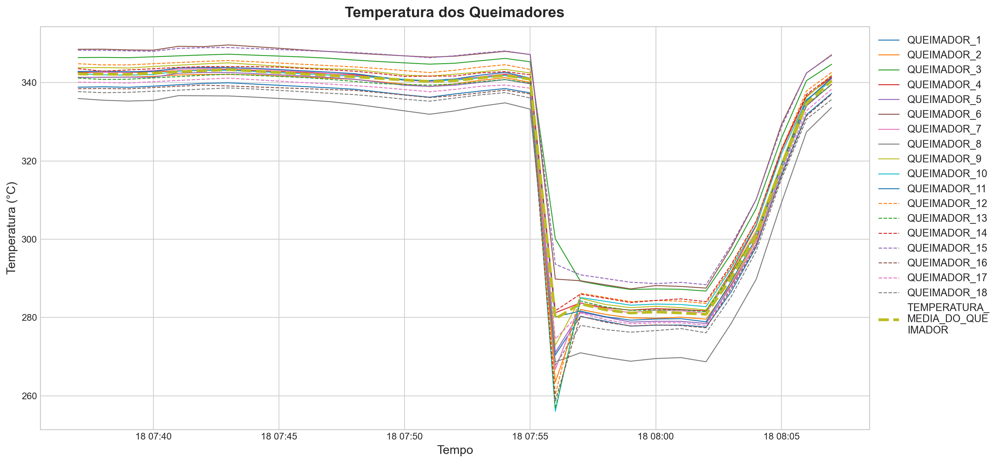

In [18]:
columns_queimadores = ['QUEIMADOR_1', 'QUEIMADOR_2', 'QUEIMADOR_3', 'QUEIMADOR_4', 'QUEIMADOR_5',
                    'QUEIMADOR_6', 'QUEIMADOR_7', 'QUEIMADOR_8', 'QUEIMADOR_9', 'QUEIMADOR_10',
                    'QUEIMADOR_11', 'QUEIMADOR_12', 'QUEIMADOR_13', 'QUEIMADOR_14', 'QUEIMADOR_15',
                    'QUEIMADOR_16', 'QUEIMADOR_17', 'QUEIMADOR_18', 'TEMPERATURA_MEDIA_DO_QUEIMADOR']
plot_data_cut(start_time2, end_time2, df, columns_queimadores, 'Temperatura dos Queimadores', 'Temperatura (°C)', greater=1)

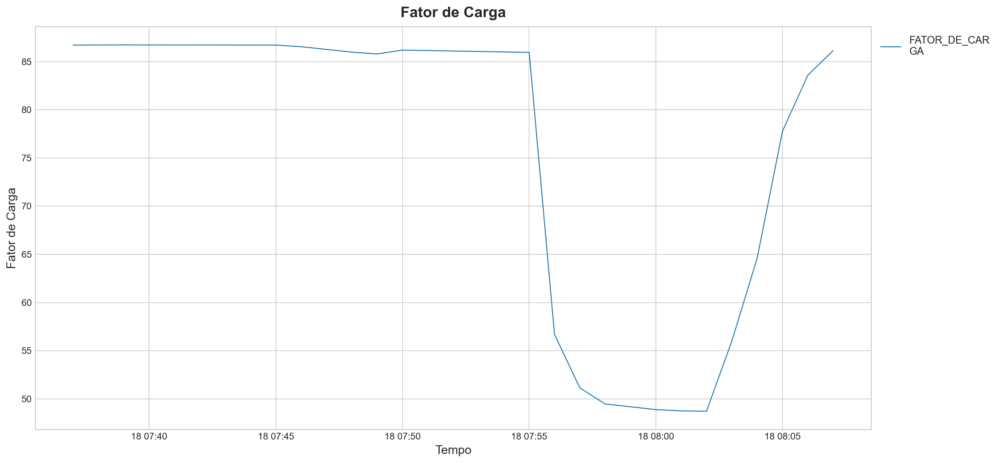

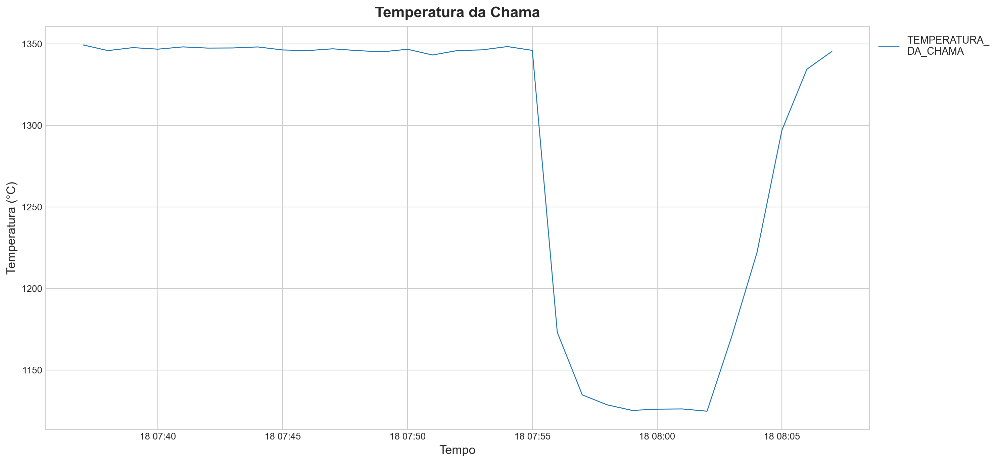

In [19]:
columns = ['FATOR_DE_CARGA', 'TEMPERATURA_DA_CHAMA']
titles = ['Fator de Carga', 'Temperatura da Chama']
ylabels = ['Fator de Carga', 'Temperatura (°C)']

for i, column in enumerate(columns):
    if isinstance(column, list):
        plot_data_cut(start_time2, end_time2, df, column, titles[i], ylabels[i], greater=0)
    else:
        plot_data_cut(start_time2, end_time2, df, [column], titles[i], ylabels[i], greater=0)

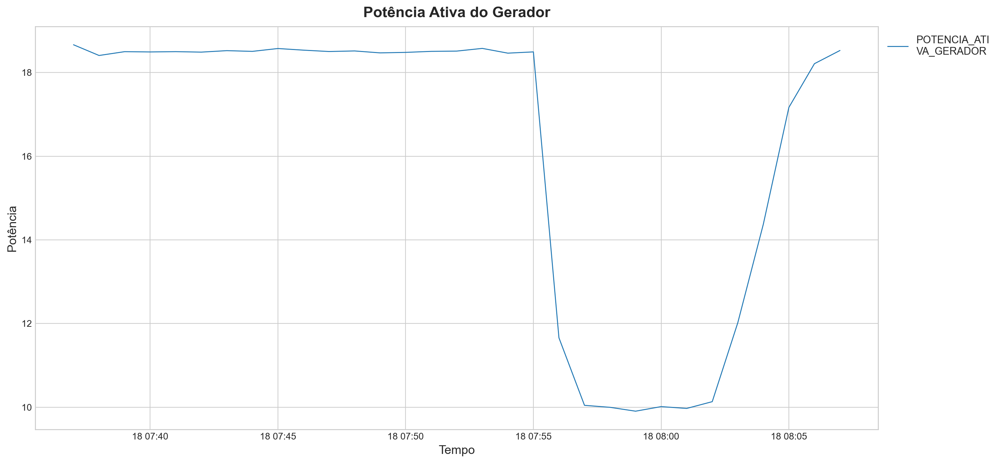

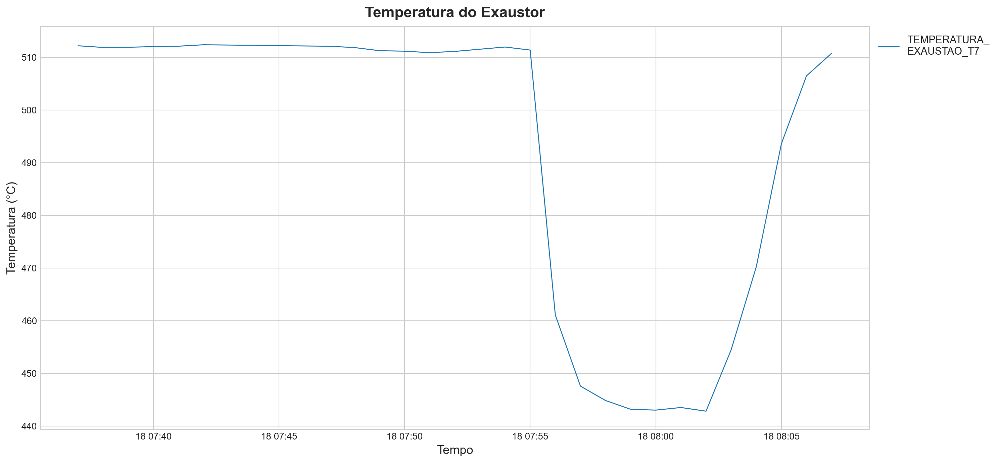

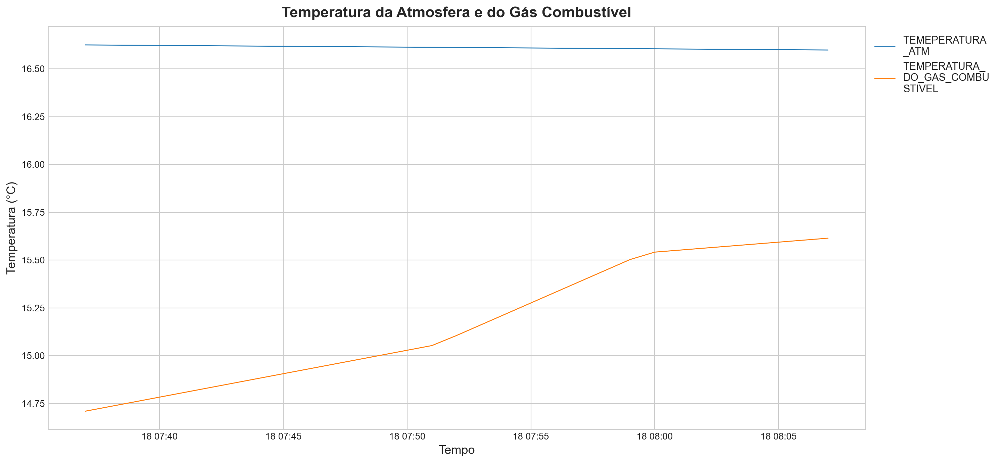

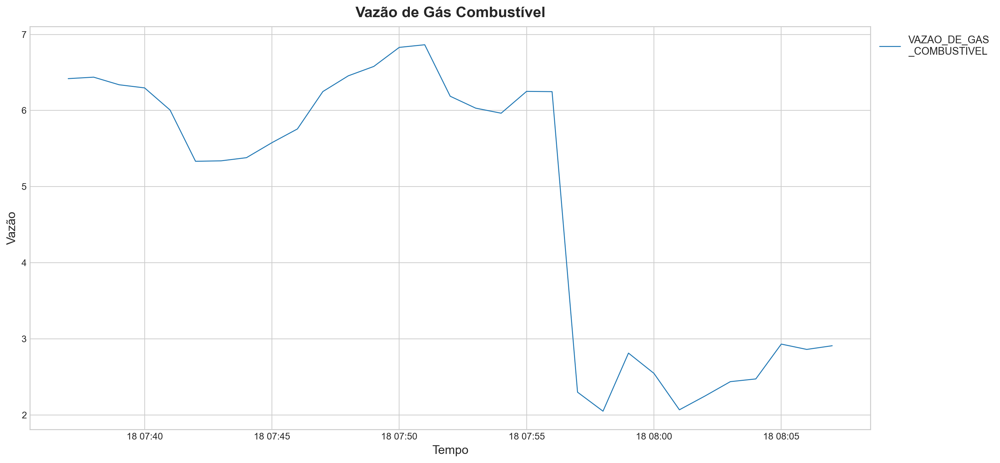

In [20]:
columns = ['POTENCIA_ATIVA_GERADOR','TEMPERATURA_EXAUSTAO_T7',['TEMEPERATURA_ATM',
            'TEMPERATURA_DO_GAS_COMBUSTIVEL'],'VAZAO_DE_GAS_COMBUSTIVEL']
titles = ['Potência Ativa do Gerador','Temperatura do Exaustor','Temperatura da Atmosfera e do Gás Combustível','Vazão de Gás Combustível']
ylabels = ['Potência','Temperatura (°C)','Temperatura (°C)','Vazão']
for i, column in enumerate(columns):
    if isinstance(column, list):
        plot_data_cut(start_time2, end_time2, df, column, titles[i], ylabels[i], greater=0)
    else:
        plot_data_cut(start_time2, end_time2, df, [column], titles[i], ylabels[i], greater=0)

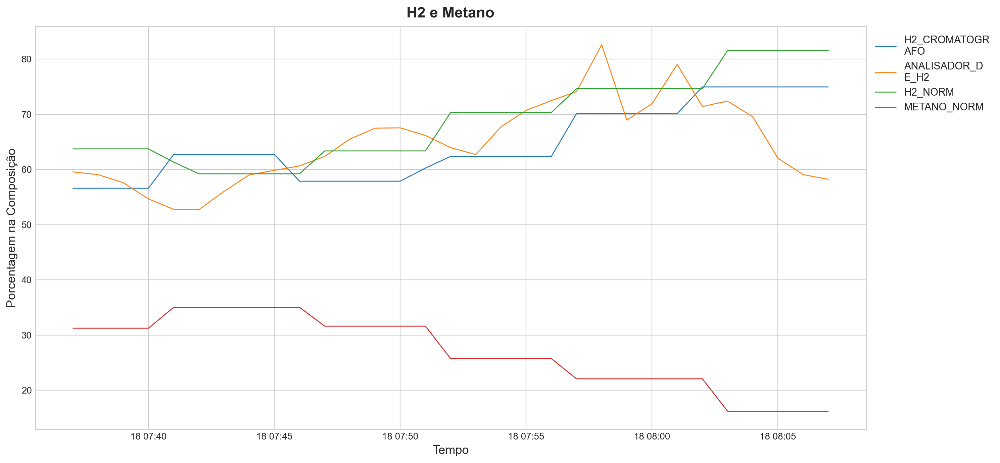

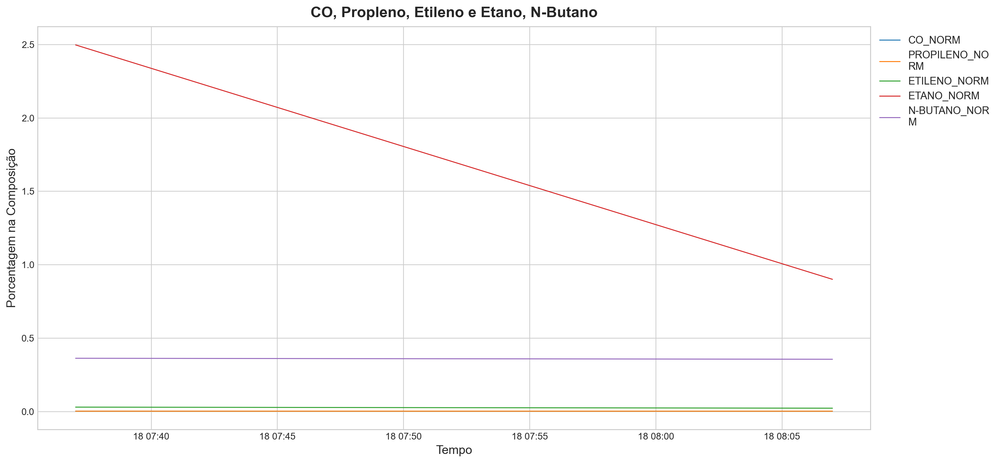

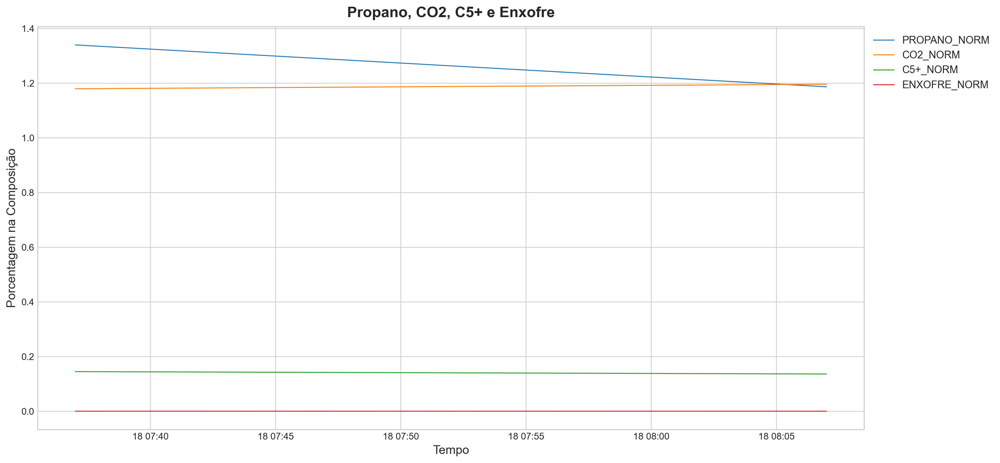

In [21]:
columns = [['H2_CROMATOGRAFO','ANALISADOR_DE_H2','H2_NORM', 'METANO_NORM'], 
           ['CO_NORM','PROPILENO_NORM','ETILENO_NORM','ETANO_NORM','N-BUTANO_NORM'],
           ['PROPANO_NORM','CO2_NORM','C5+_NORM','ENXOFRE_NORM']]
titles = ['H2 e Metano','CO, Propleno, Etileno e Etano, N-Butano','Propano, CO2, C5+ e Enxofre']
ylabels = ['Porcentagem na Composição','Porcentagem na Composição','Porcentagem na Composição']
for i, column in enumerate(columns):
    if isinstance(column, list):
        plot_data_cut(start_time2, end_time2, df, column, titles[i], ylabels[i], greater=0)
    else:
        plot_data_cut(start_time2, end_time2, df, [column], titles[i], ylabels[i], greater=0)

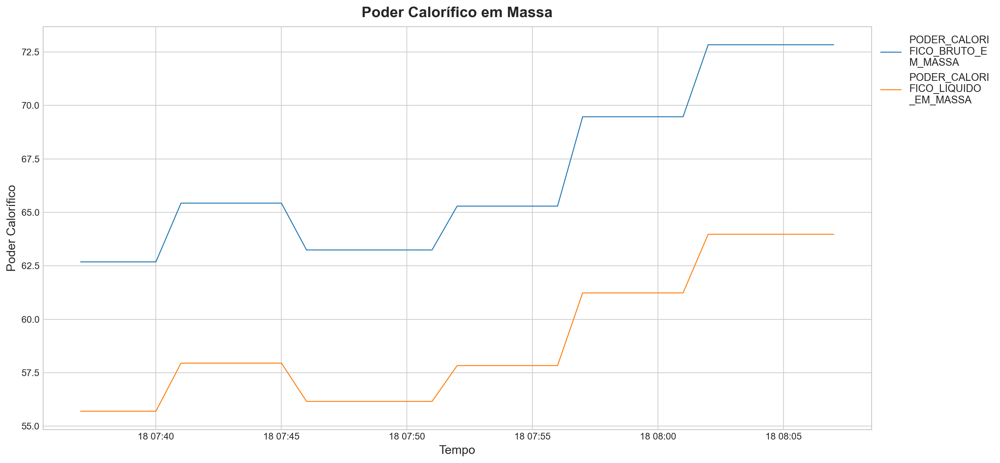

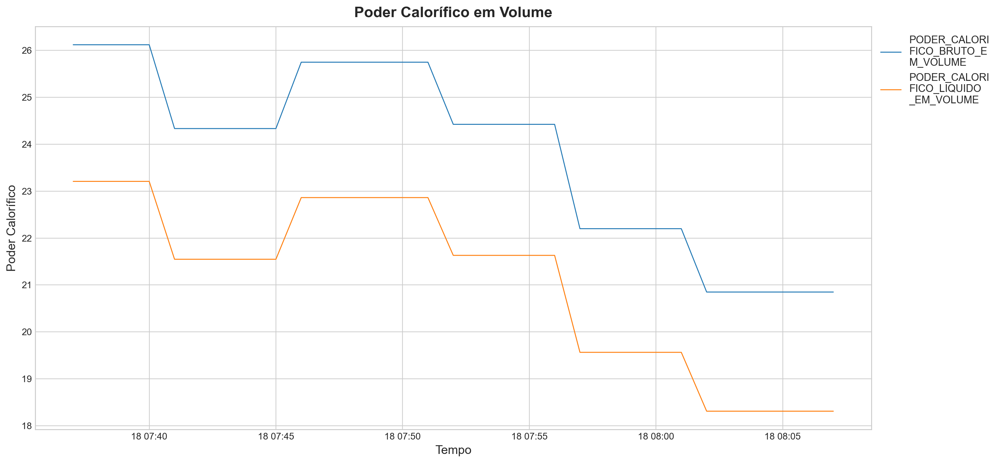

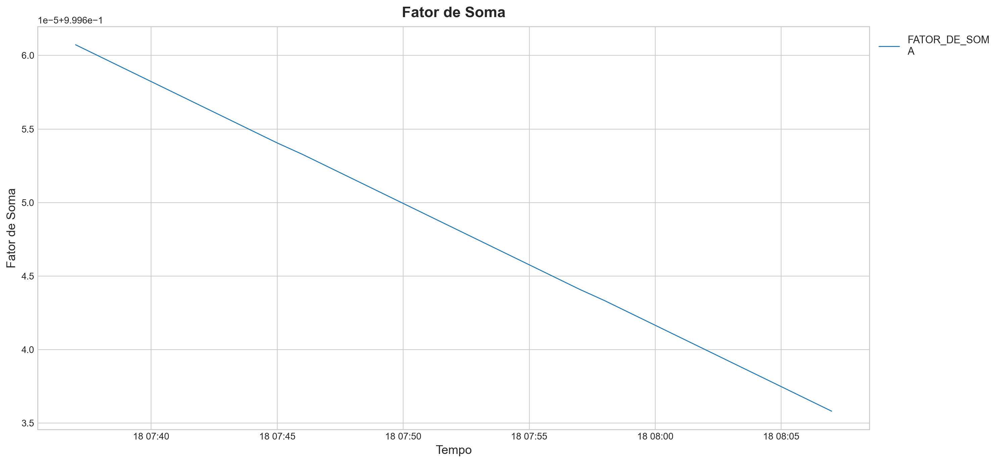

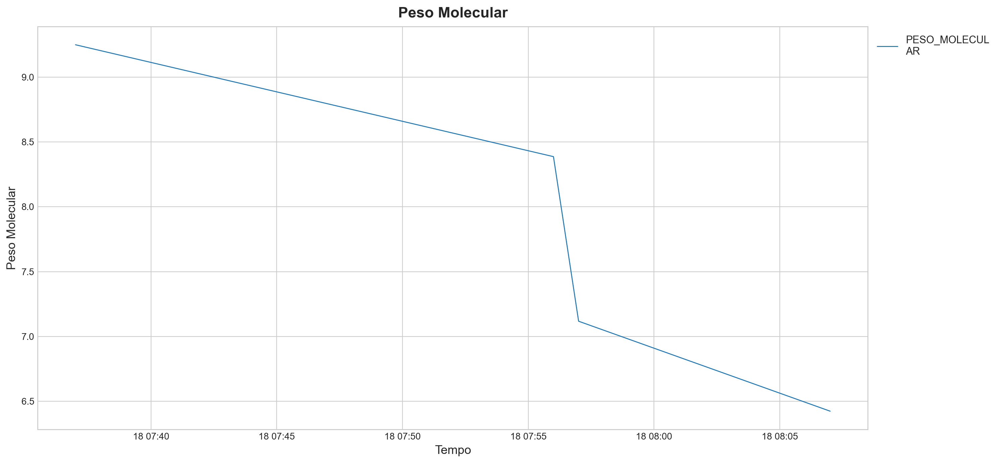

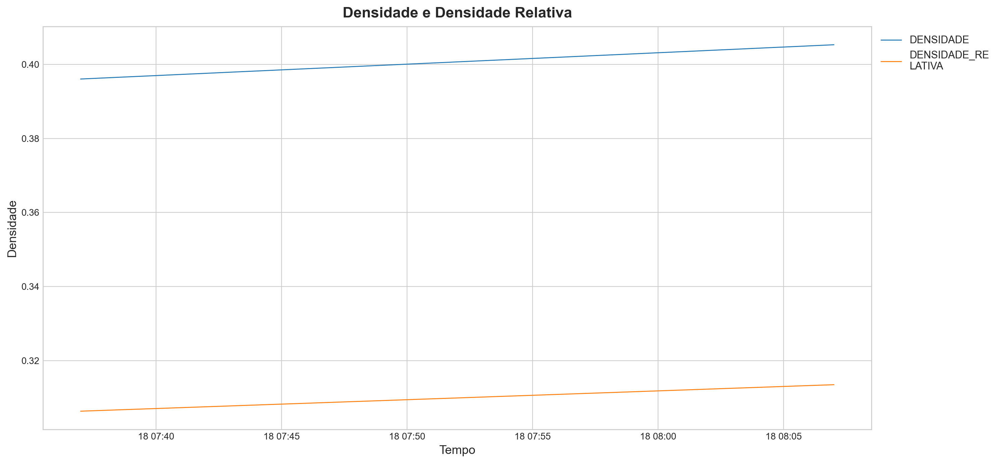

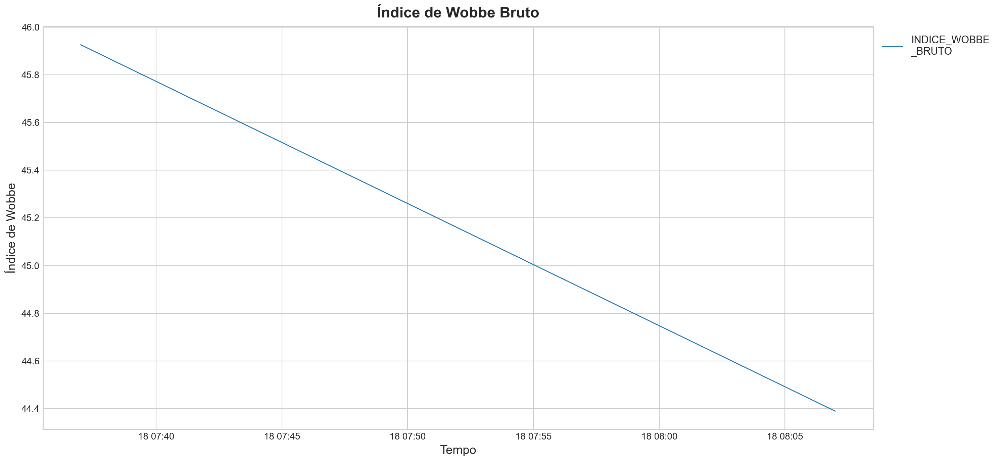

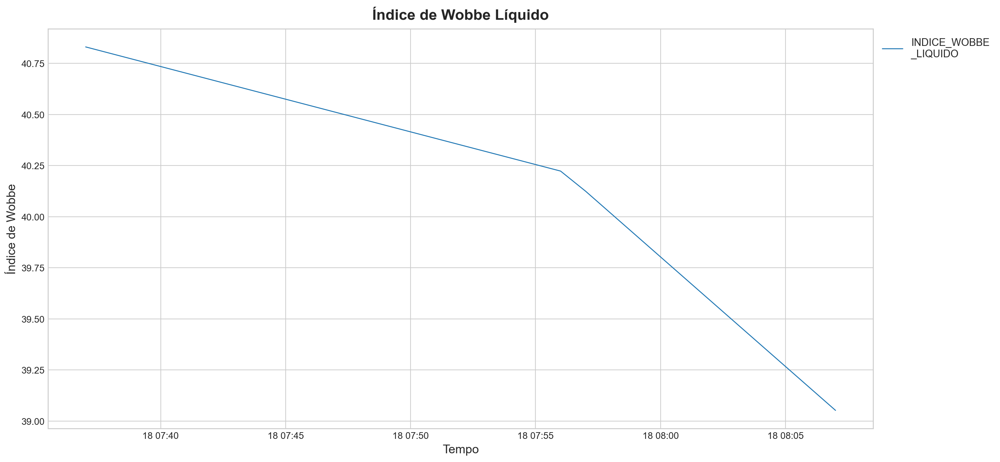

In [22]:
columns = [['PODER_CALORIFICO_BRUTO_EM_MASSA','PODER_CALORIFICO_LIQUIDO_EM_MASSA'],
           ['PODER_CALORIFICO_BRUTO_EM_VOLUME','PODER_CALORIFICO_LIQUIDO_EM_VOLUME'],
            'FATOR_DE_SOMA','PESO_MOLECULAR',['DENSIDADE','DENSIDADE_RELATIVA'],
            'INDICE_WOBBE_BRUTO','INDICE_WOBBE_LIQUIDO']
titles = ['Poder Calorífico em Massa','Poder Calorífico em Volume','Fator de Soma','Peso Molecular',
            'Densidade e Densidade Relativa','Índice de Wobbe Bruto', 'Índice de Wobbe Líquido']
ylabels = ['Poder Calorífico','Poder Calorífico','Fator de Soma','Peso Molecular',
            'Densidade','Índice de Wobbe','Índice de Wobbe']

for i, column in enumerate(columns):
    if isinstance(column, list):
        plot_data_cut(start_time2, end_time2, df, column, titles[i], ylabels[i], greater=0)
    else:
        plot_data_cut(start_time2, end_time2, df, [column], titles[i], ylabels[i], greater=0)

## Cortes (2024-07-18 14:11:00 / 2024-07-18 14:41:00) - 2ª Parada

In [24]:
start_time3 = '2024-07-18 14:11:00'
end_time3 = '2024-07-18 14:41:00'

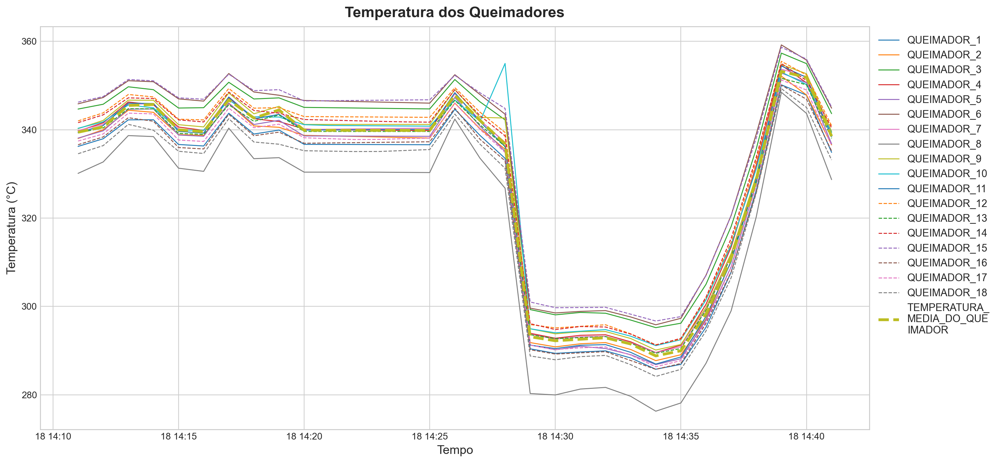

In [25]:
columns_queimadores = ['QUEIMADOR_1', 'QUEIMADOR_2', 'QUEIMADOR_3', 'QUEIMADOR_4', 'QUEIMADOR_5',
                    'QUEIMADOR_6', 'QUEIMADOR_7', 'QUEIMADOR_8', 'QUEIMADOR_9', 'QUEIMADOR_10',
                    'QUEIMADOR_11', 'QUEIMADOR_12', 'QUEIMADOR_13', 'QUEIMADOR_14', 'QUEIMADOR_15',
                    'QUEIMADOR_16', 'QUEIMADOR_17', 'QUEIMADOR_18', 'TEMPERATURA_MEDIA_DO_QUEIMADOR']
plot_data_cut(start_time3, end_time3, df, columns_queimadores, 'Temperatura dos Queimadores', 'Temperatura (°C)', greater=1)

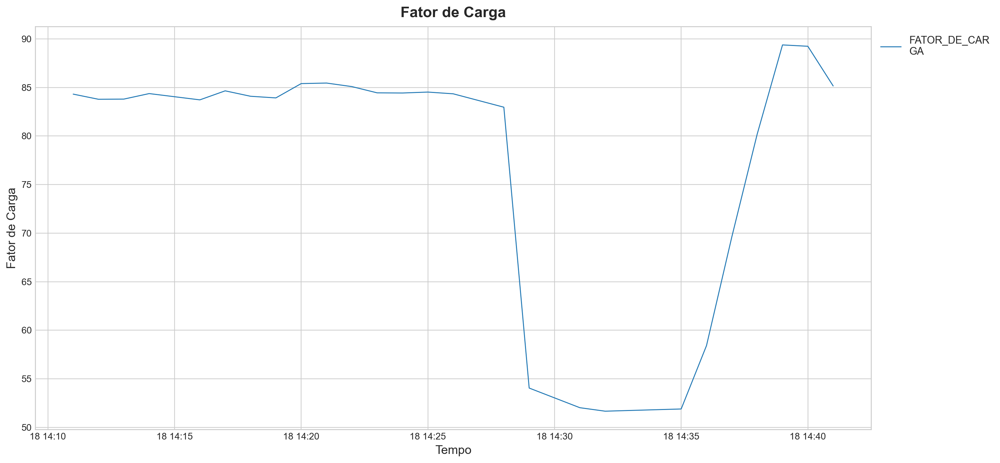

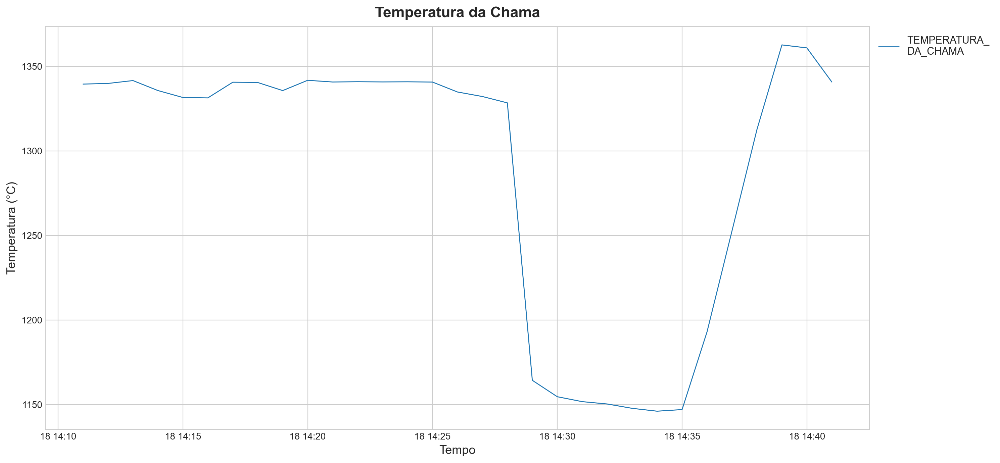

In [26]:
columns = ['FATOR_DE_CARGA', 'TEMPERATURA_DA_CHAMA']
titles = ['Fator de Carga', 'Temperatura da Chama']
ylabels = ['Fator de Carga', 'Temperatura (°C)']

for i, column in enumerate(columns):
    if isinstance(column, list):
        plot_data_cut(start_time3, end_time3, df, column, titles[i], ylabels[i], greater=0)
    else:
        plot_data_cut(start_time3, end_time3, df, [column], titles[i], ylabels[i], greater=0)

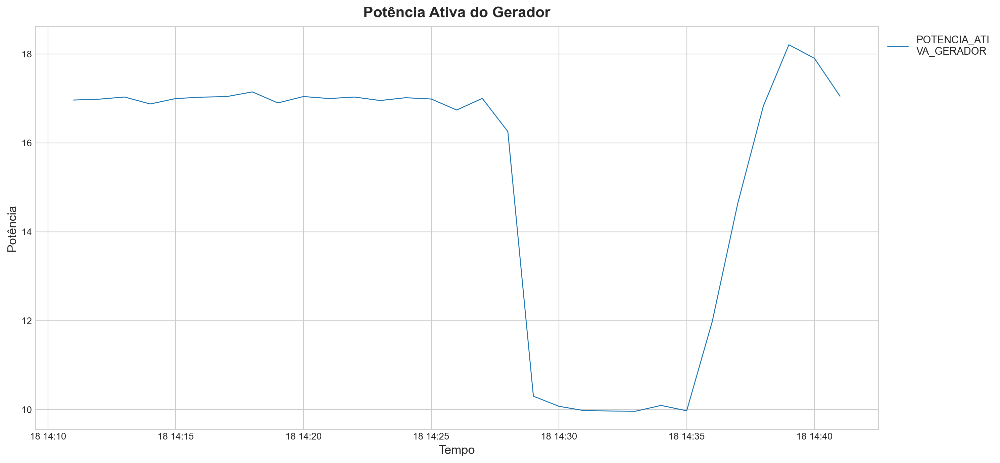

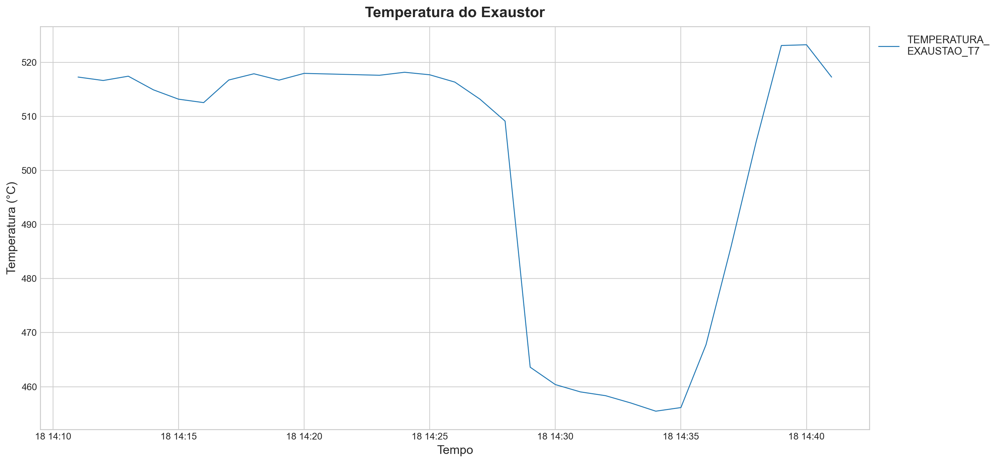

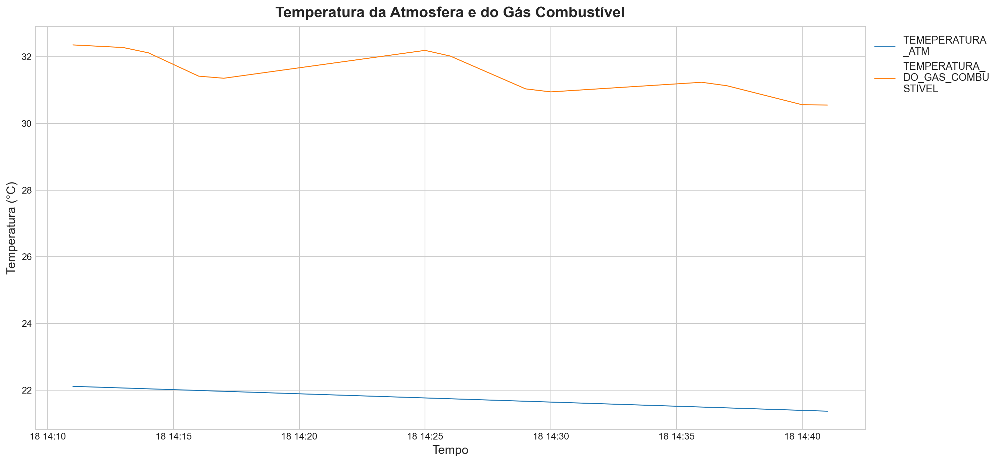

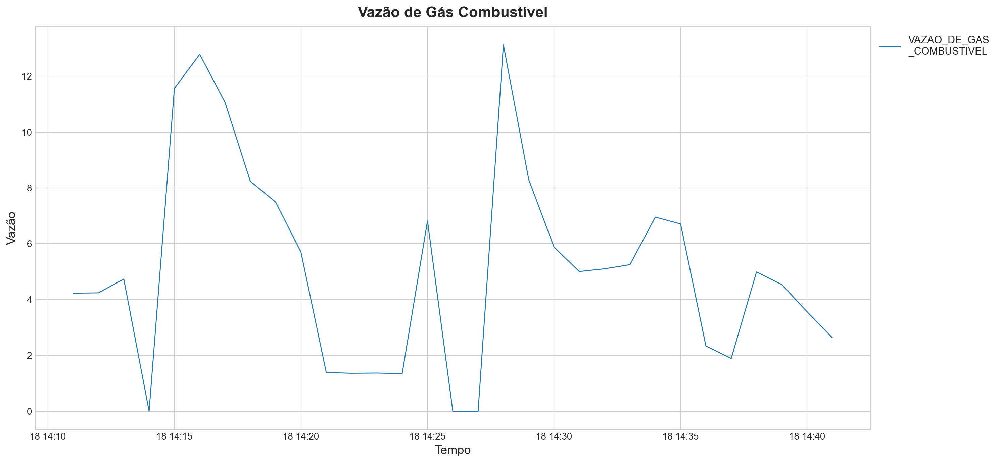

In [27]:
columns = ['POTENCIA_ATIVA_GERADOR','TEMPERATURA_EXAUSTAO_T7',['TEMEPERATURA_ATM',
            'TEMPERATURA_DO_GAS_COMBUSTIVEL'],'VAZAO_DE_GAS_COMBUSTIVEL']
titles = ['Potência Ativa do Gerador','Temperatura do Exaustor','Temperatura da Atmosfera e do Gás Combustível','Vazão de Gás Combustível']
ylabels = ['Potência','Temperatura (°C)','Temperatura (°C)','Vazão']
for i, column in enumerate(columns):
    if isinstance(column, list):
        plot_data_cut(start_time3, end_time3, df, column, titles[i], ylabels[i], greater=0)
    else:
        plot_data_cut(start_time3, end_time3, df, [column], titles[i], ylabels[i], greater=0)

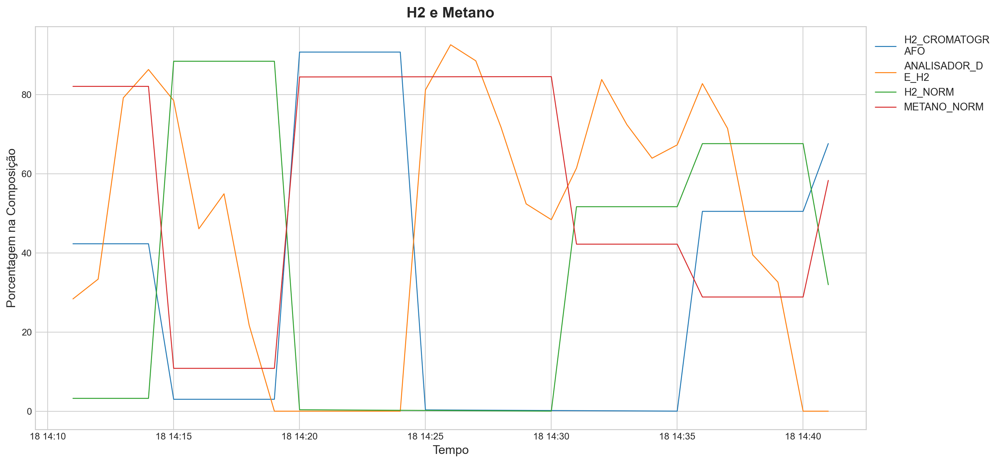

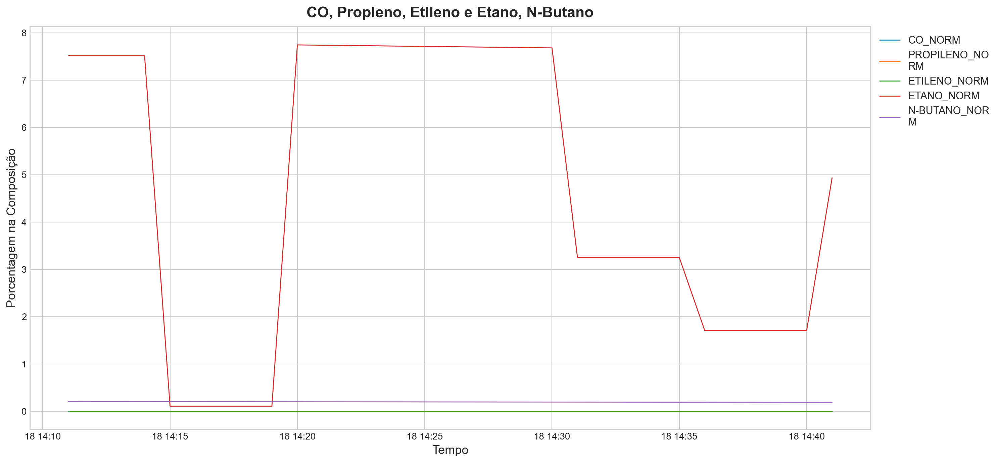

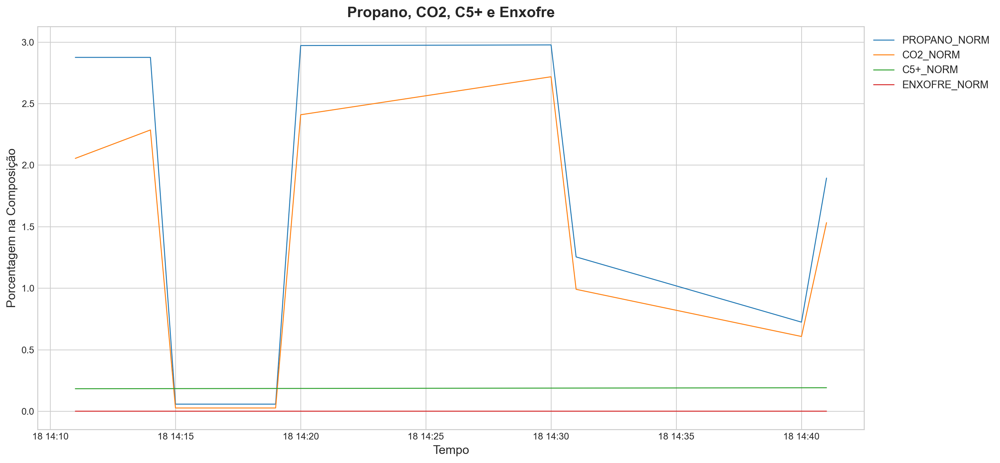

In [28]:
columns = [['H2_CROMATOGRAFO','ANALISADOR_DE_H2','H2_NORM', 'METANO_NORM'], 
           ['CO_NORM','PROPILENO_NORM','ETILENO_NORM','ETANO_NORM','N-BUTANO_NORM'],
           ['PROPANO_NORM','CO2_NORM','C5+_NORM','ENXOFRE_NORM']]
titles = ['H2 e Metano','CO, Propleno, Etileno e Etano, N-Butano','Propano, CO2, C5+ e Enxofre']
ylabels = ['Porcentagem na Composição','Porcentagem na Composição','Porcentagem na Composição']
for i, column in enumerate(columns):
    if isinstance(column, list):
        plot_data_cut(start_time3, end_time3, df, column, titles[i], ylabels[i], greater=0)
    else:
        plot_data_cut(start_time3, end_time3, df, [column], titles[i], ylabels[i], greater=0)

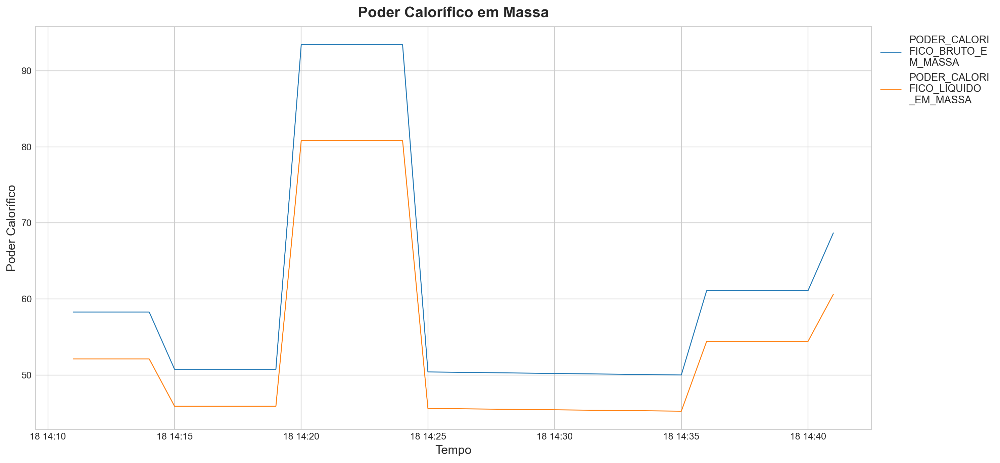

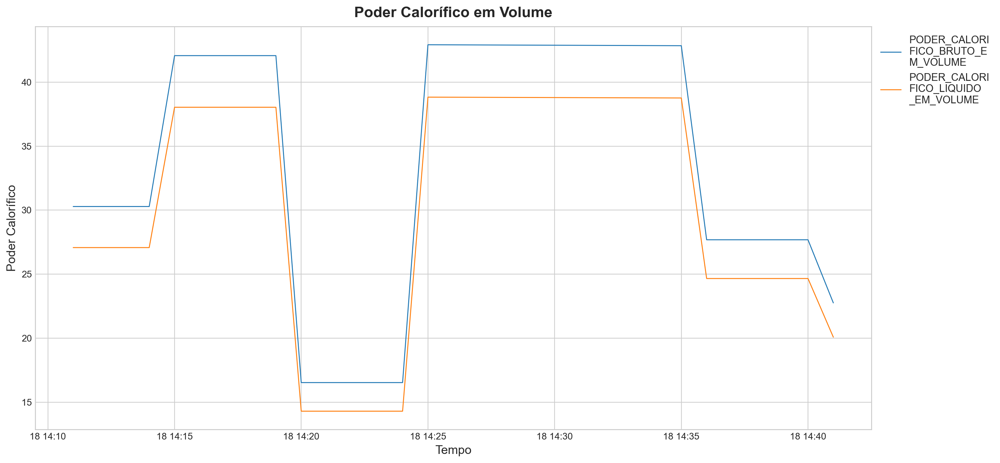

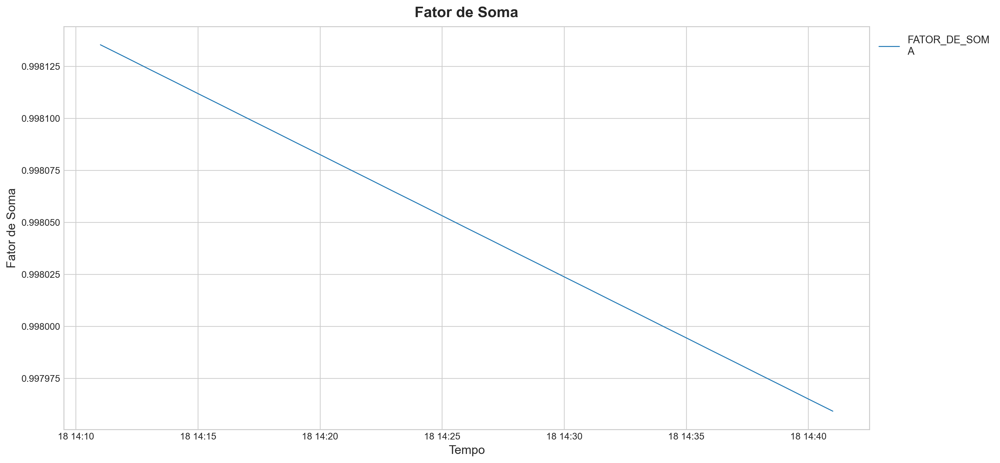

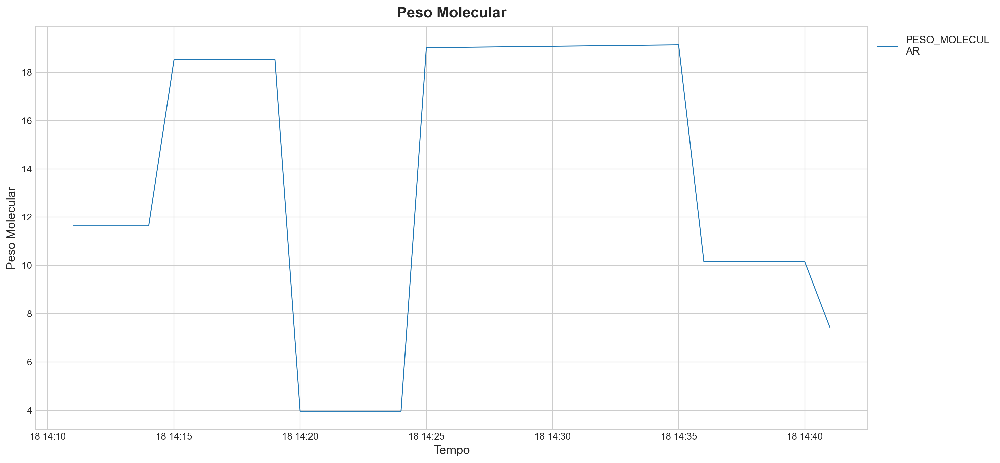

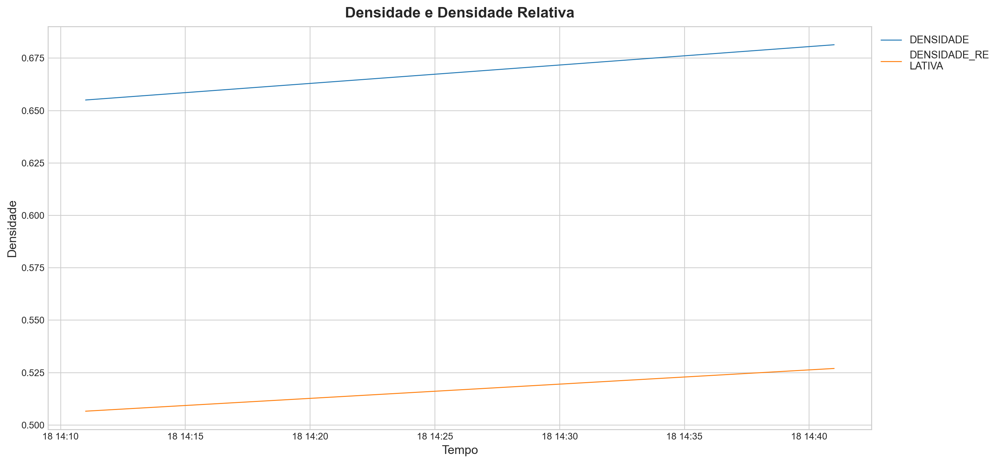

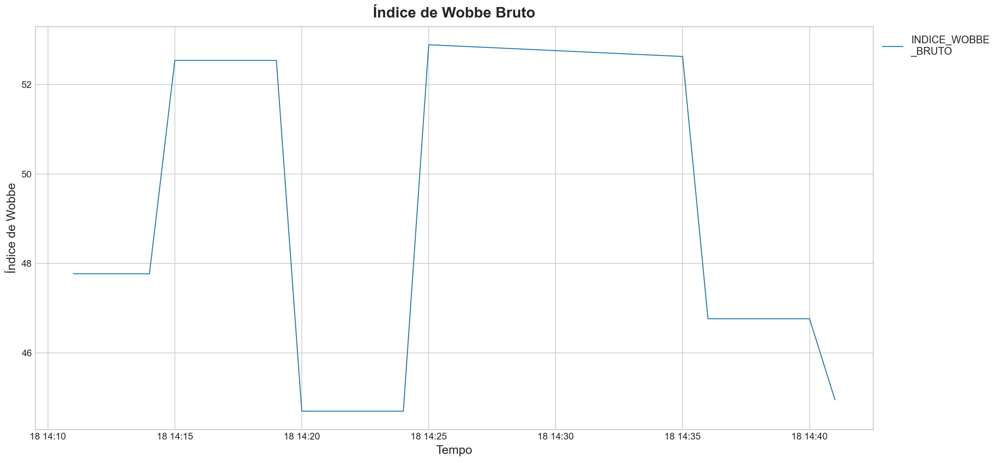

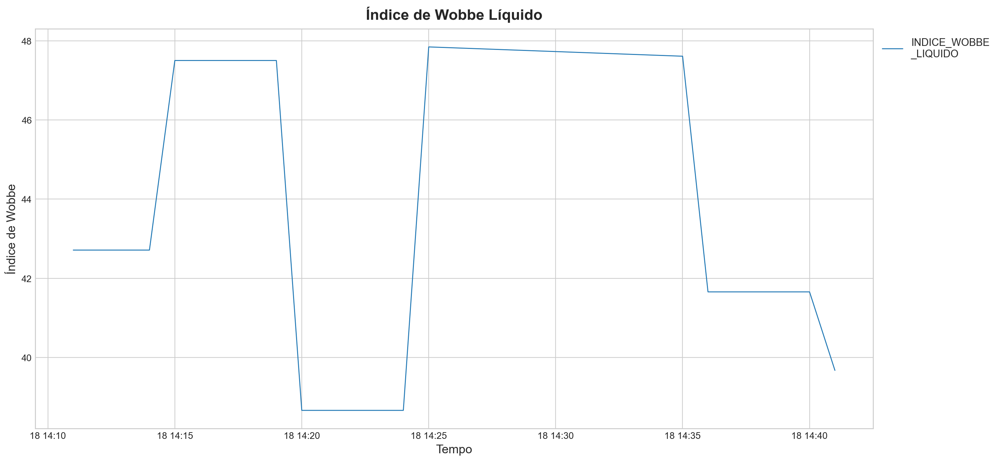

In [ ]:
columns = [['PODER_CALORIFICO_BRUTO_EM_MASSA','PODER_CALORIFICO_LIQUIDO_EM_MASSA'],
           ['PODER_CALORIFICO_BRUTO_EM_VOLUME','PODER_CALORIFICO_LIQUIDO_EM_VOLUME'],
            'FATOR_DE_SOMA','PESO_MOLECULAR',['DENSIDADE','DENSIDADE_RELATIVA'],
            'INDICE_WOBBE_BRUTO','INDICE_WOBBE_LIQUIDO']
titles = ['Poder Calorífico em Massa','Poder Calorífico em Volume','Fator de Soma','Peso Molecular',
            'Densidade e Densidade Relativa','Índice de Wobbe Bruto', 'Índice de Wobbe Líquido']
ylabels = ['Poder Calorífico','Poder Calorífico','Fator de Soma','Peso Molecular',
            'Densidade','Índice de Wobbe','Índice de Wobbe']

for i, column in enumerate(columns):
    if isinstance(column, list):
        plot_data_cut(start_time3, end_time3, df, column, titles[i], ylabels[i], greater=0)
    else:
        plot_data_cut(start_time3, end_time3, df, [column], titles[i], ylabels[i], greater=0)

## Cortes (2024-07-18 15:37:00 / 2024-07-18 16:07:00) - 3ª Parada

In [34]:
start_time4 = '2024-07-18 15:37:00'
end_time4 = '2024-07-18 16:07:00'

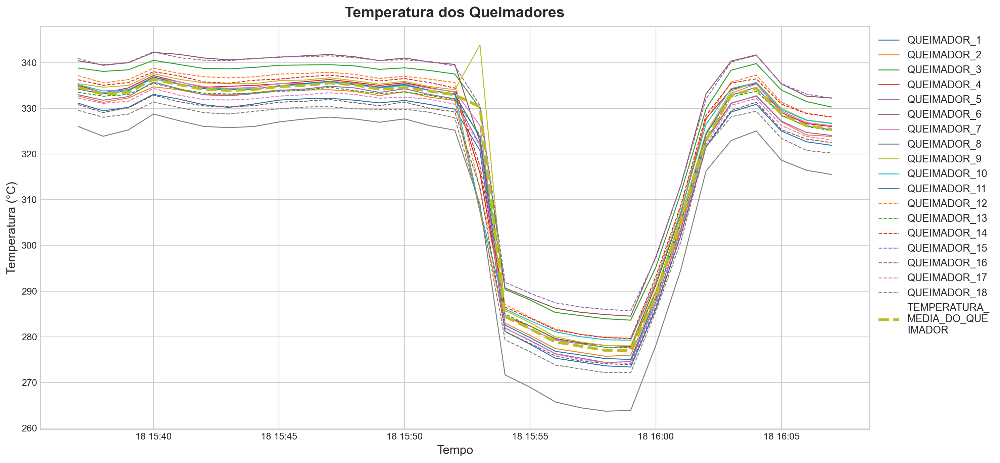

In [35]:
columns_queimadores = ['QUEIMADOR_1', 'QUEIMADOR_2', 'QUEIMADOR_3', 'QUEIMADOR_4', 'QUEIMADOR_5',
                    'QUEIMADOR_6', 'QUEIMADOR_7', 'QUEIMADOR_8', 'QUEIMADOR_9', 'QUEIMADOR_10',
                    'QUEIMADOR_11', 'QUEIMADOR_12', 'QUEIMADOR_13', 'QUEIMADOR_14', 'QUEIMADOR_15',
                    'QUEIMADOR_16', 'QUEIMADOR_17', 'QUEIMADOR_18', 'TEMPERATURA_MEDIA_DO_QUEIMADOR']
plot_data_cut(start_time4, end_time4, df, columns_queimadores, 'Temperatura dos Queimadores', 'Temperatura (°C)', greater=1)

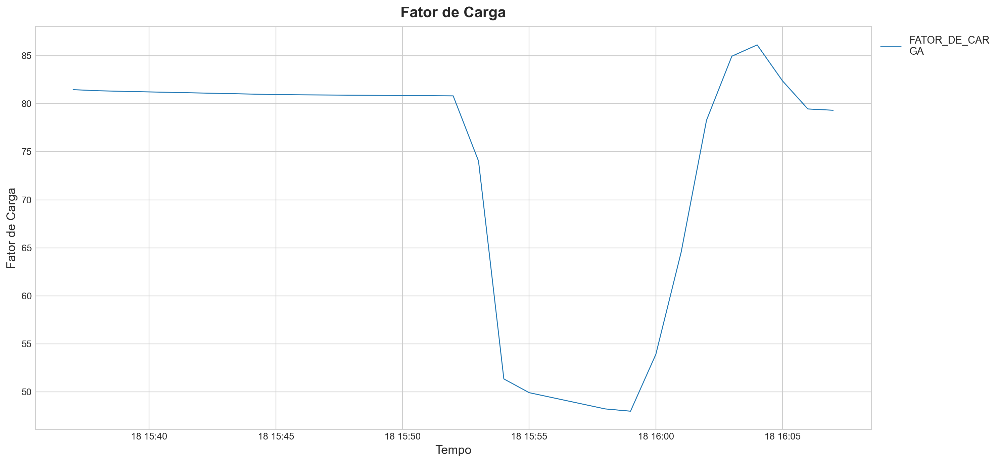

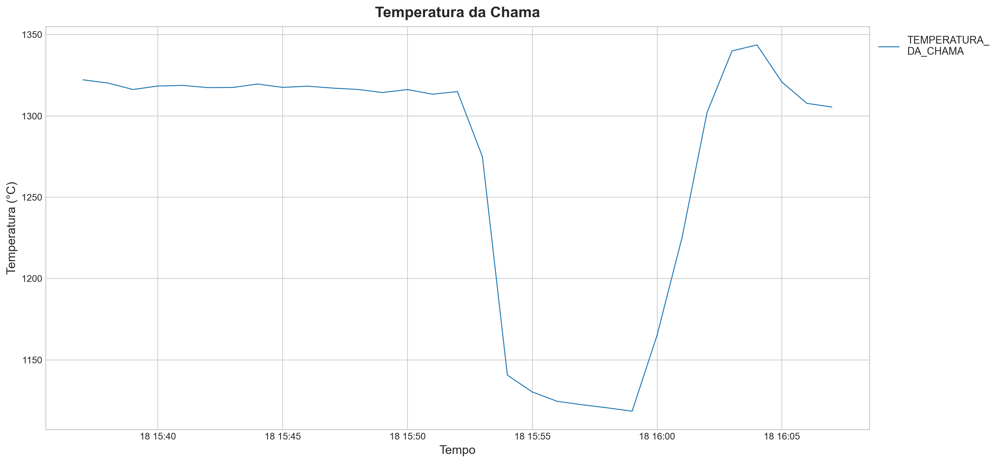

In [36]:
columns = ['FATOR_DE_CARGA', 'TEMPERATURA_DA_CHAMA']
titles = ['Fator de Carga', 'Temperatura da Chama']
ylabels = ['Fator de Carga', 'Temperatura (°C)']

for i, column in enumerate(columns):
    if isinstance(column, list):
        plot_data_cut(start_time4, end_time4, df, column, titles[i], ylabels[i], greater=0)
    else:
        plot_data_cut(start_time4, end_time4, df, [column], titles[i], ylabels[i], greater=0)

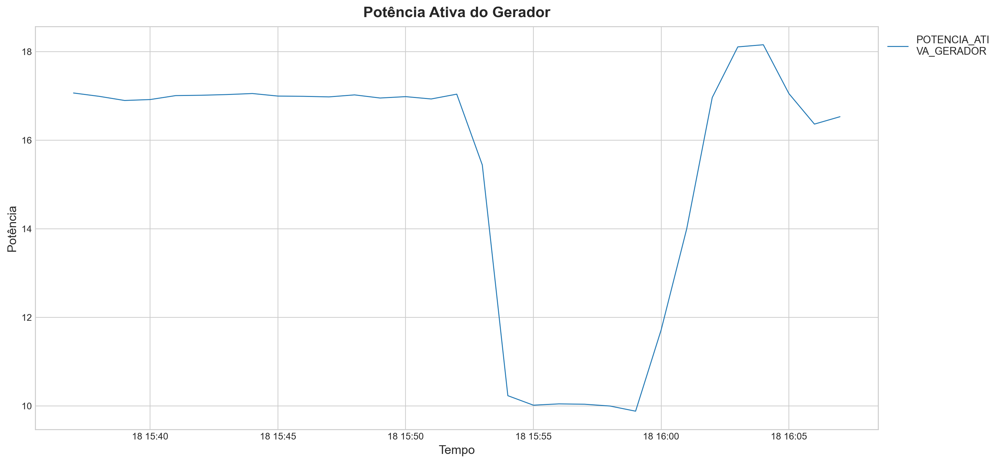

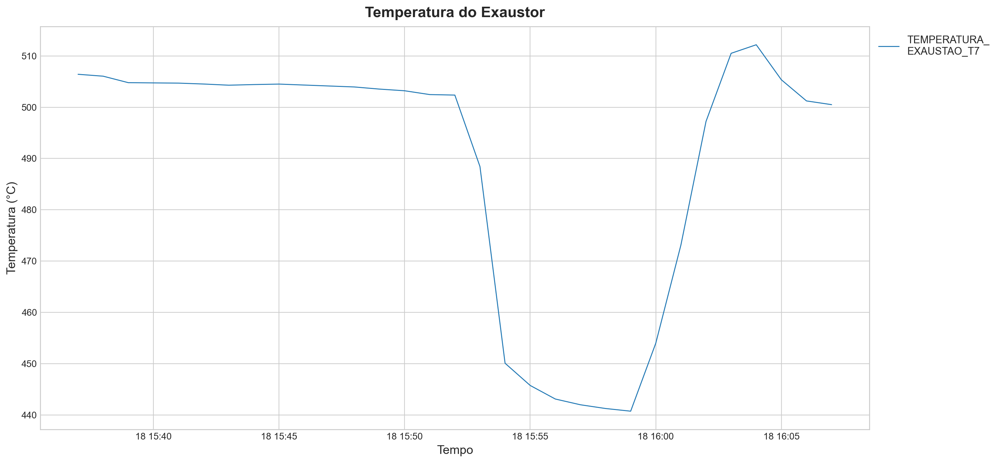

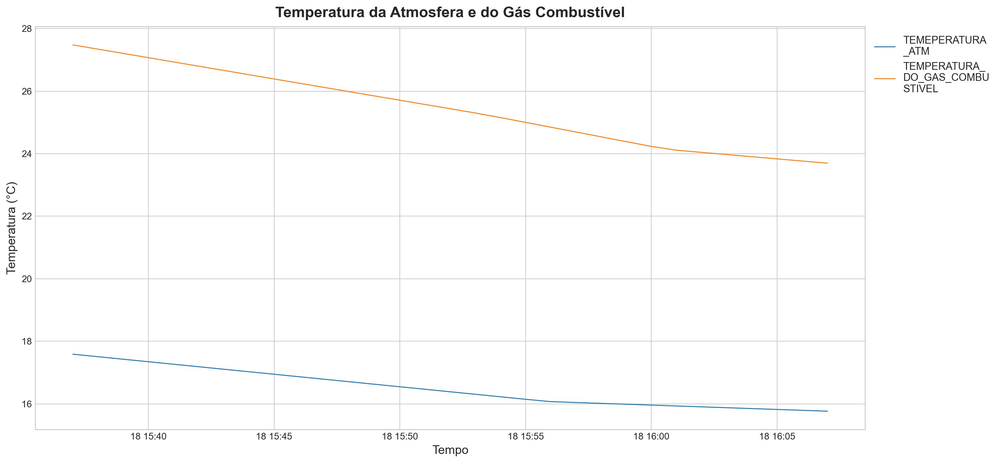

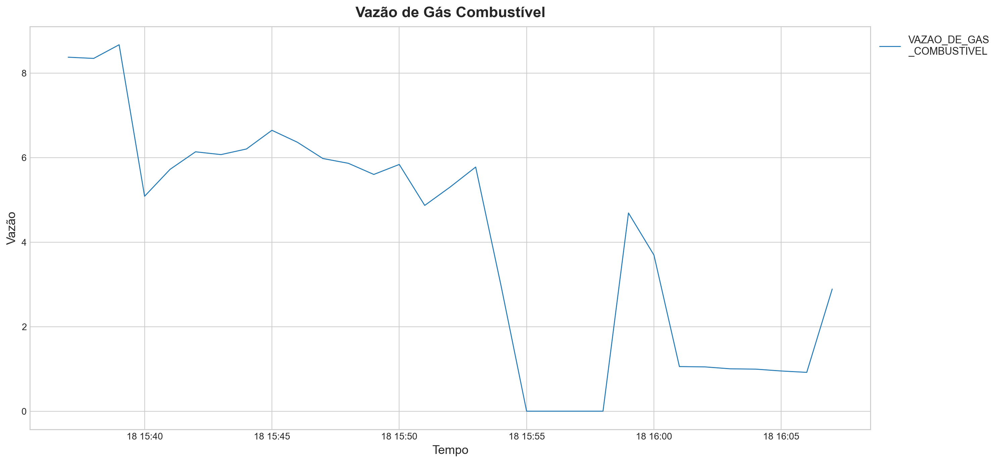

In [37]:
columns = ['POTENCIA_ATIVA_GERADOR','TEMPERATURA_EXAUSTAO_T7',['TEMEPERATURA_ATM',
            'TEMPERATURA_DO_GAS_COMBUSTIVEL'],'VAZAO_DE_GAS_COMBUSTIVEL']
titles = ['Potência Ativa do Gerador','Temperatura do Exaustor','Temperatura da Atmosfera e do Gás Combustível','Vazão de Gás Combustível']
ylabels = ['Potência','Temperatura (°C)','Temperatura (°C)','Vazão']
for i, column in enumerate(columns):
    if isinstance(column, list):
        plot_data_cut(start_time4, end_time4, df, column, titles[i], ylabels[i], greater=0)
    else:
        plot_data_cut(start_time4, end_time4, df, [column], titles[i], ylabels[i], greater=0)

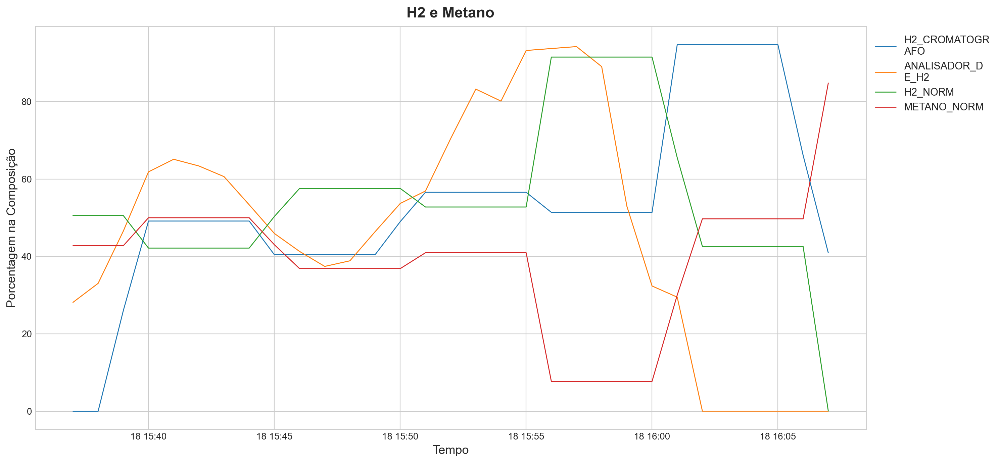

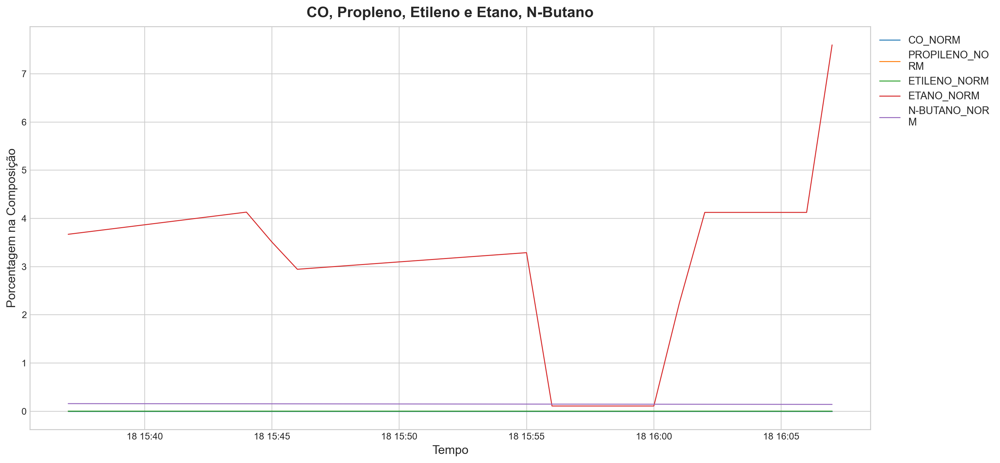

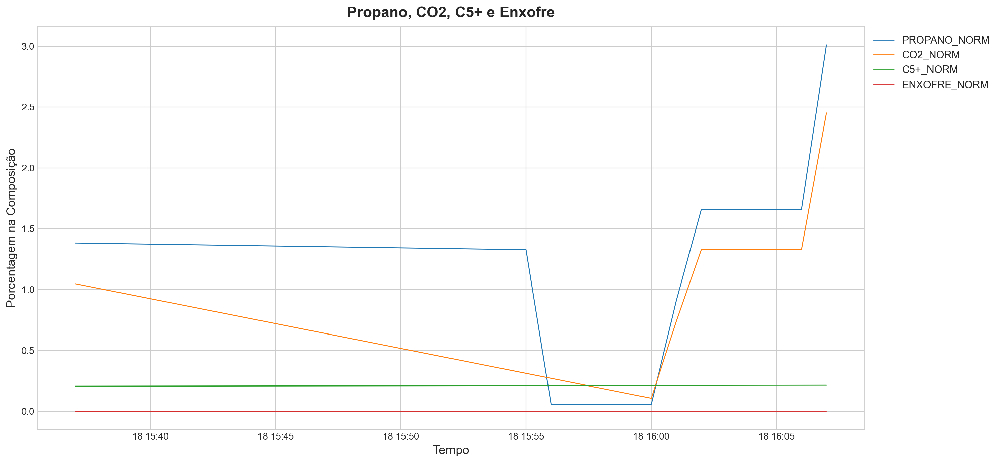

In [38]:
columns = [['H2_CROMATOGRAFO','ANALISADOR_DE_H2','H2_NORM', 'METANO_NORM'], 
           ['CO_NORM','PROPILENO_NORM','ETILENO_NORM','ETANO_NORM','N-BUTANO_NORM'],
           ['PROPANO_NORM','CO2_NORM','C5+_NORM','ENXOFRE_NORM']]
titles = ['H2 e Metano','CO, Propleno, Etileno e Etano, N-Butano','Propano, CO2, C5+ e Enxofre']
ylabels = ['Porcentagem na Composição','Porcentagem na Composição','Porcentagem na Composição']
for i, column in enumerate(columns):
    if isinstance(column, list):
        plot_data_cut(start_time4, end_time4, df, column, titles[i], ylabels[i], greater=0)
    else:
        plot_data_cut(start_time4, end_time4, df, [column], titles[i], ylabels[i], greater=0)

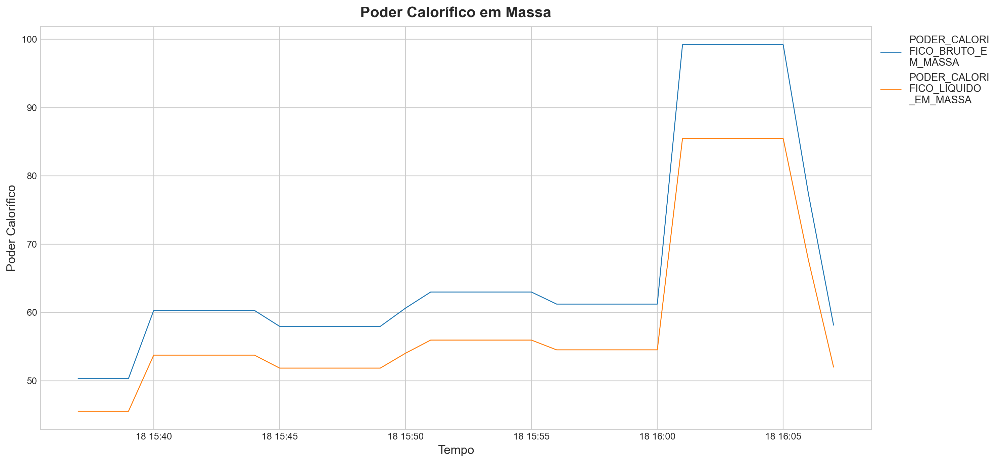

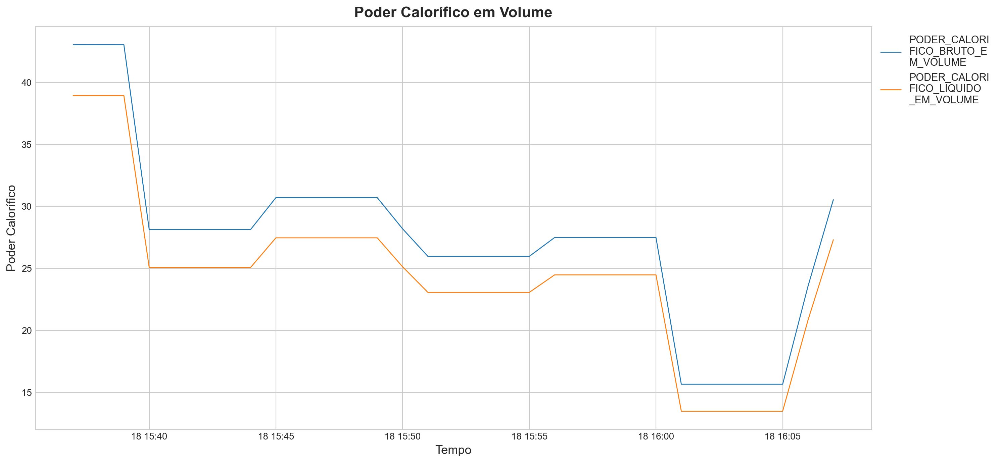

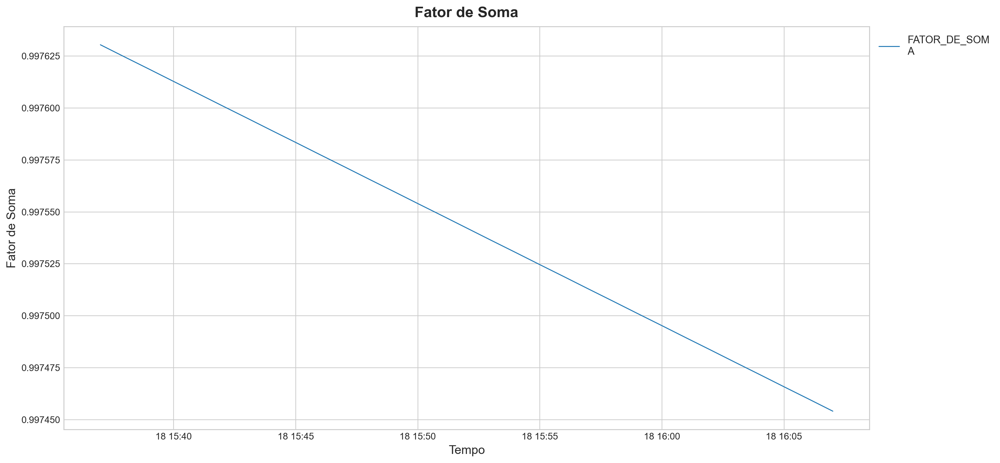

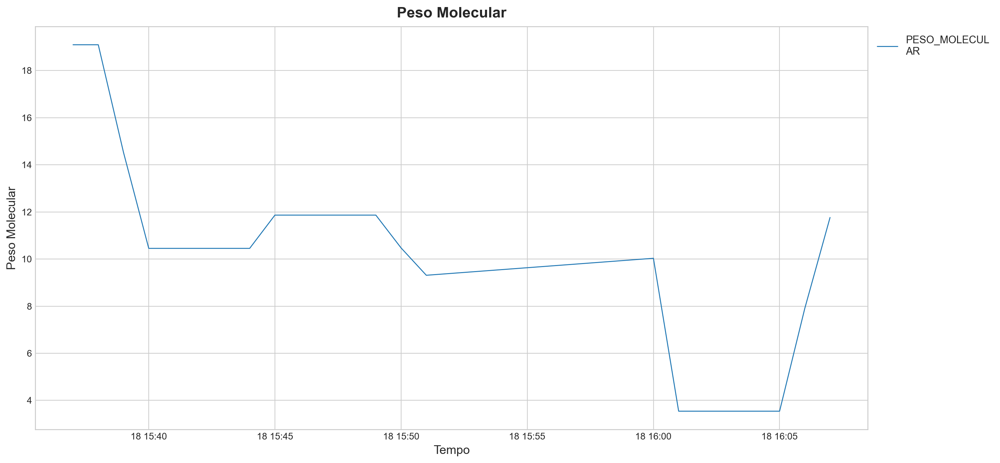

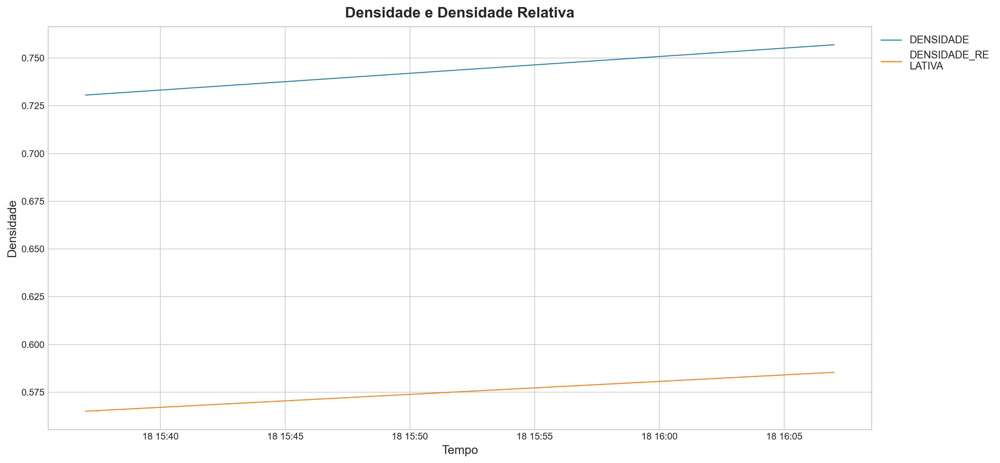

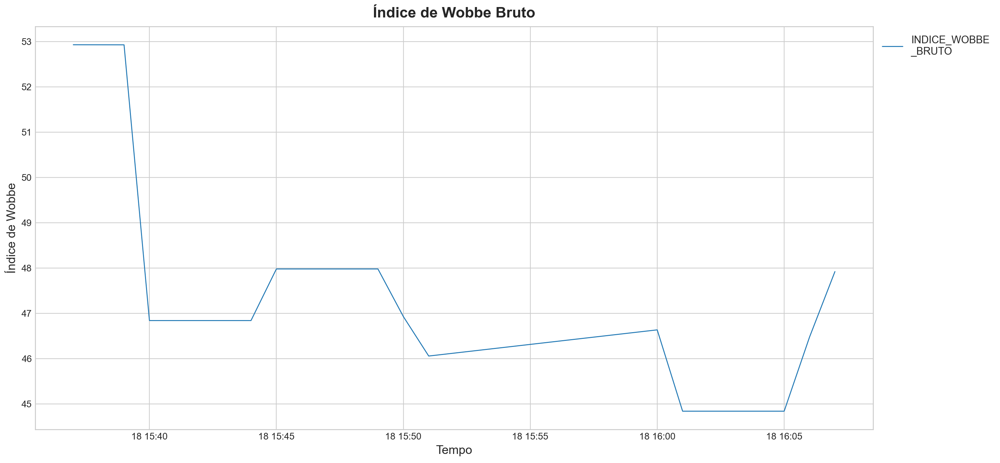

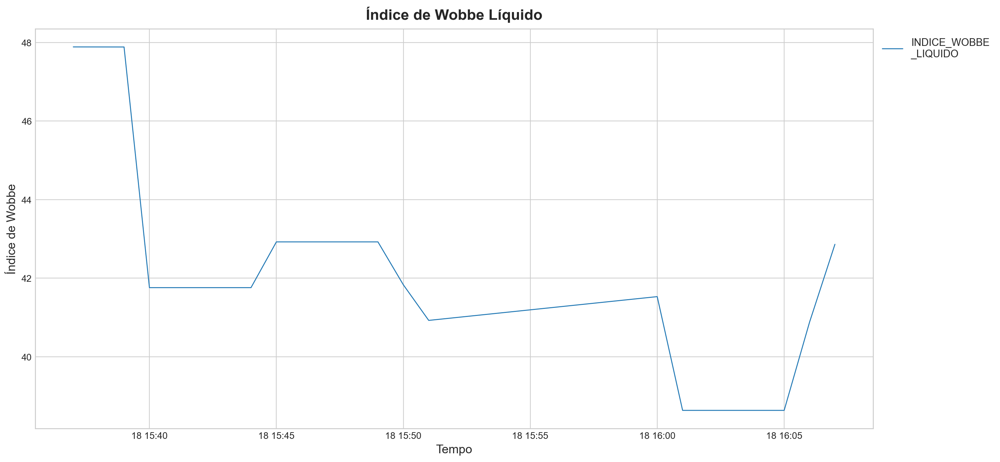

In [39]:
columns = [['PODER_CALORIFICO_BRUTO_EM_MASSA','PODER_CALORIFICO_LIQUIDO_EM_MASSA'],
           ['PODER_CALORIFICO_BRUTO_EM_VOLUME','PODER_CALORIFICO_LIQUIDO_EM_VOLUME'],
            'FATOR_DE_SOMA','PESO_MOLECULAR',['DENSIDADE','DENSIDADE_RELATIVA'],
            'INDICE_WOBBE_BRUTO','INDICE_WOBBE_LIQUIDO']
titles = ['Poder Calorífico em Massa','Poder Calorífico em Volume','Fator de Soma','Peso Molecular',
            'Densidade e Densidade Relativa','Índice de Wobbe Bruto', 'Índice de Wobbe Líquido']
ylabels = ['Poder Calorífico','Poder Calorífico','Fator de Soma','Peso Molecular',
            'Densidade','Índice de Wobbe','Índice de Wobbe']

for i, column in enumerate(columns):
    if isinstance(column, list):
        plot_data_cut(start_time4, end_time4, df, column, titles[i], ylabels[i], greater=0)
    else:
        plot_data_cut(start_time4, end_time4, df, [column], titles[i], ylabels[i], greater=0)

## Todo o período e marcadores de corte

In [44]:
cuts = [start_time1, start_time2, start_time3, start_time4]
cuts_names = ['normal', 'parada_1', 'parada_2', 'parada_3']

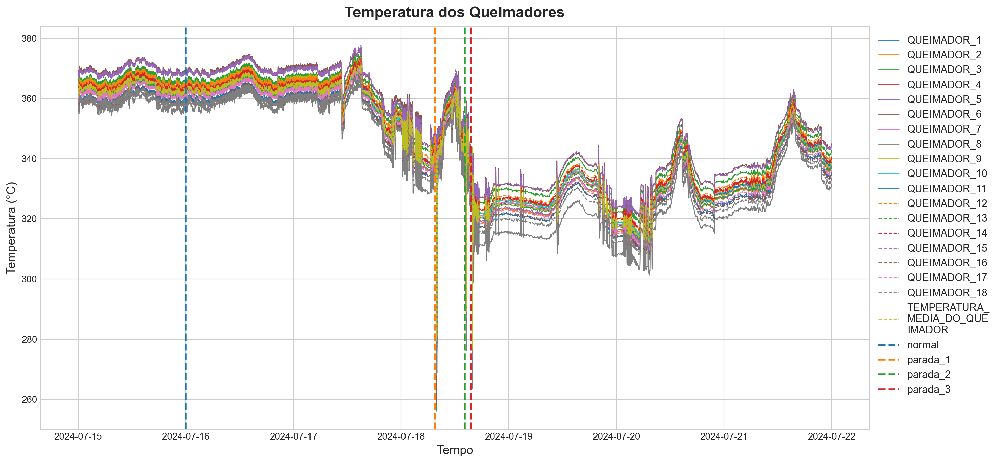

In [47]:
columns_queimadores = ['QUEIMADOR_1', 'QUEIMADOR_2', 'QUEIMADOR_3', 'QUEIMADOR_4', 'QUEIMADOR_5',
                    'QUEIMADOR_6', 'QUEIMADOR_7', 'QUEIMADOR_8', 'QUEIMADOR_9', 'QUEIMADOR_10',
                    'QUEIMADOR_11', 'QUEIMADOR_12', 'QUEIMADOR_13', 'QUEIMADOR_14', 'QUEIMADOR_15',
                    'QUEIMADOR_16', 'QUEIMADOR_17', 'QUEIMADOR_18', 'TEMPERATURA_MEDIA_DO_QUEIMADOR']
plot_data_cut_v(df.index[0], df.index[-1], df, columns_queimadores, 'Temperatura dos Queimadores', 'Temperatura (°C)', cuts=cuts, cuts_names=cuts_names, greater=0)

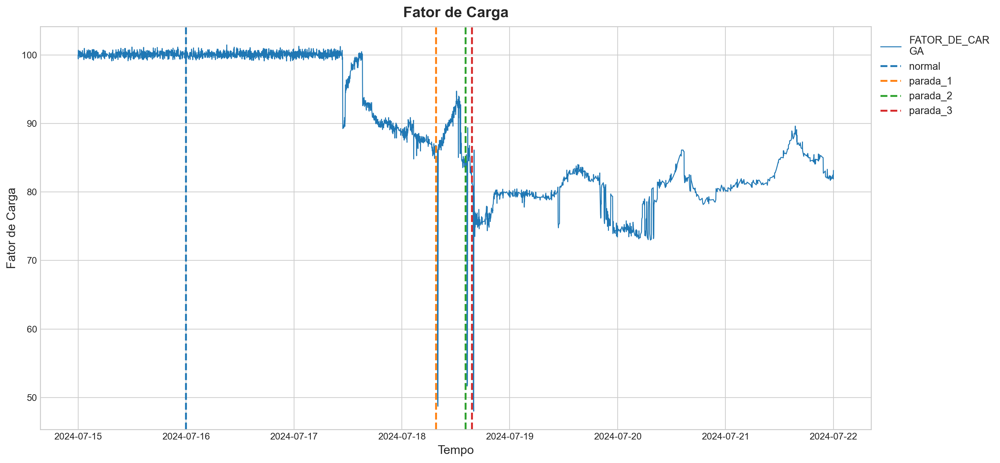

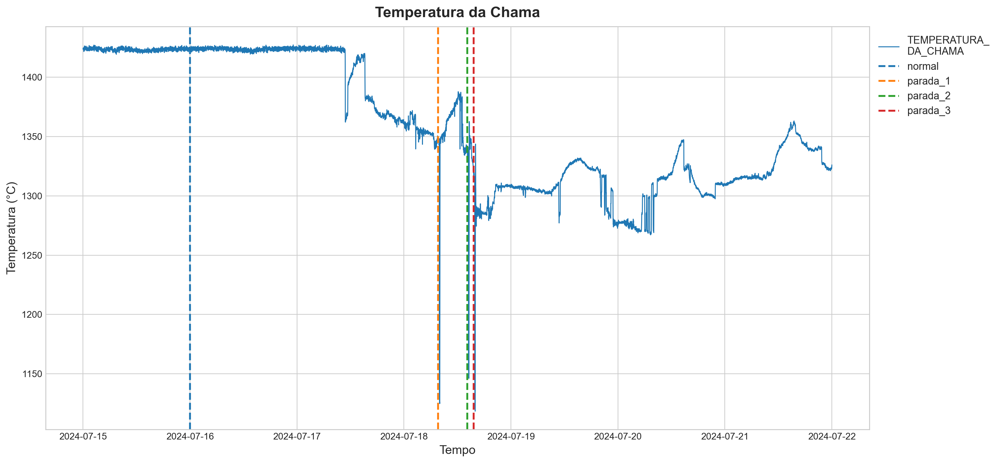

In [48]:
columns = ['FATOR_DE_CARGA', 'TEMPERATURA_DA_CHAMA']
titles = ['Fator de Carga', 'Temperatura da Chama']
ylabels = ['Fator de Carga', 'Temperatura (°C)']

for i, column in enumerate(columns):
    if isinstance(column, list):
        plot_data_cut_v(df.index[0], df.index[-1], df, column, titles[i], ylabels[i], cuts=cuts, cuts_names=cuts_names, greater=0)
    else:
        plot_data_cut_v(df.index[0], df.index[-1], df, [column], titles[i], ylabels[i], cuts=cuts, cuts_names=cuts_names, greater=0)

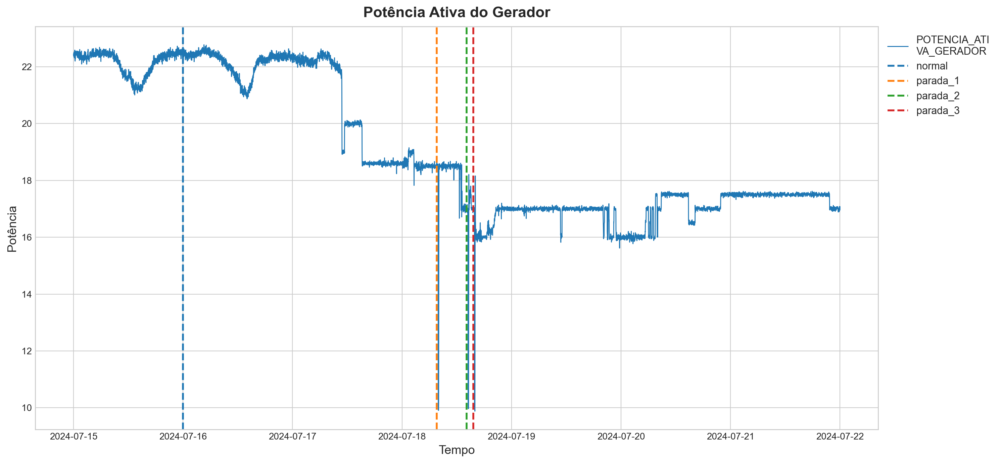

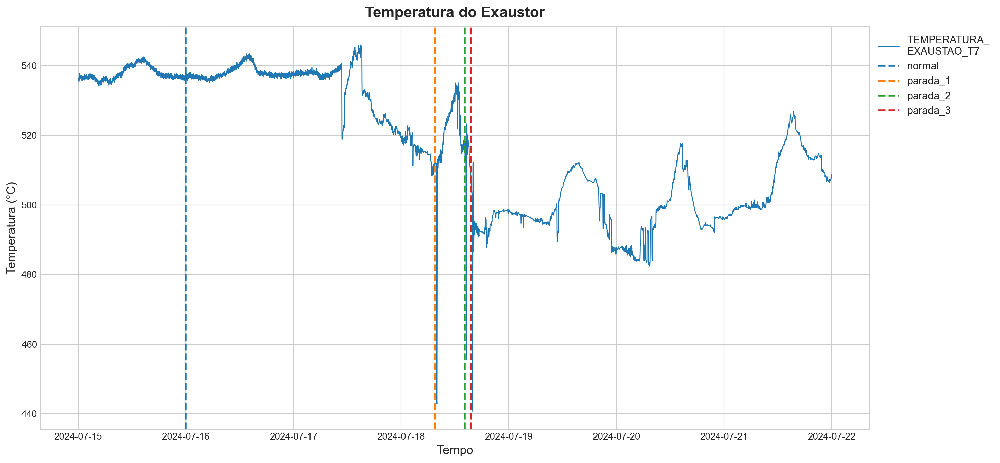

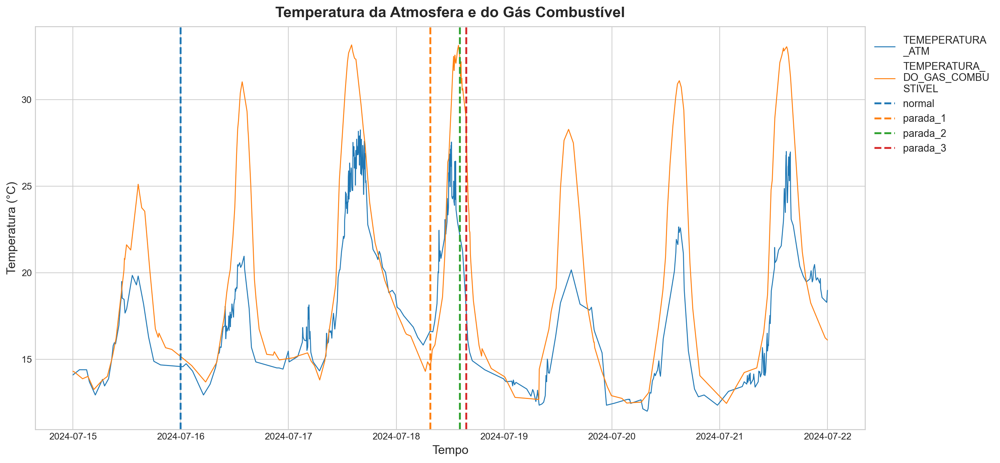

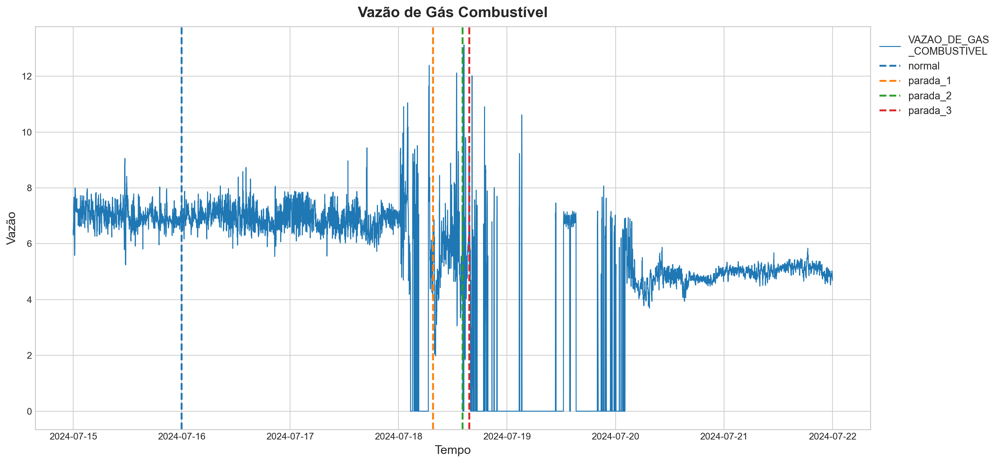

In [49]:
columns = ['POTENCIA_ATIVA_GERADOR','TEMPERATURA_EXAUSTAO_T7',['TEMEPERATURA_ATM',
            'TEMPERATURA_DO_GAS_COMBUSTIVEL'],'VAZAO_DE_GAS_COMBUSTIVEL']
titles = ['Potência Ativa do Gerador','Temperatura do Exaustor','Temperatura da Atmosfera e do Gás Combustível','Vazão de Gás Combustível']
ylabels = ['Potência','Temperatura (°C)','Temperatura (°C)','Vazão']

for i, column in enumerate(columns):
    if isinstance(column, list):
        plot_data_cut_v(df.index[0], df.index[-1], df, column, titles[i], ylabels[i], cuts=cuts, cuts_names=cuts_names, greater=0)
    else:
        plot_data_cut_v(df.index[0], df.index[-1], df, [column], titles[i], ylabels[i], cuts=cuts, cuts_names=cuts_names, greater=0)

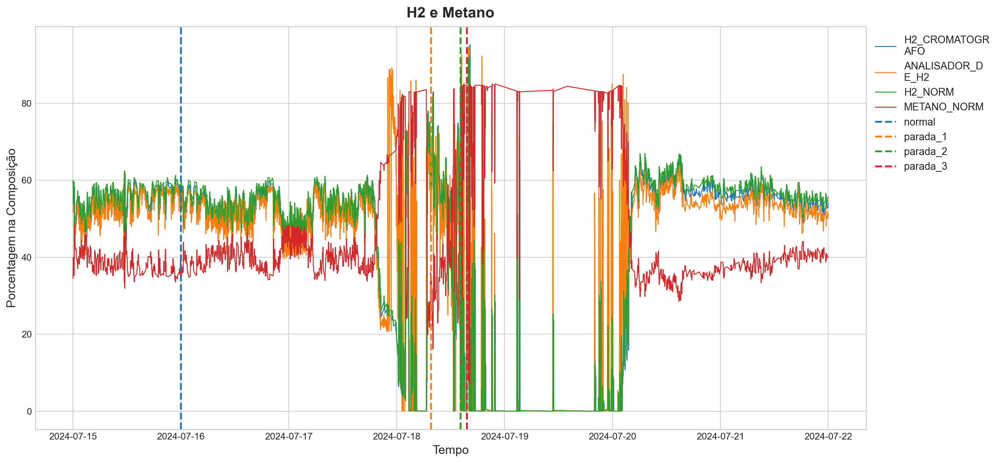

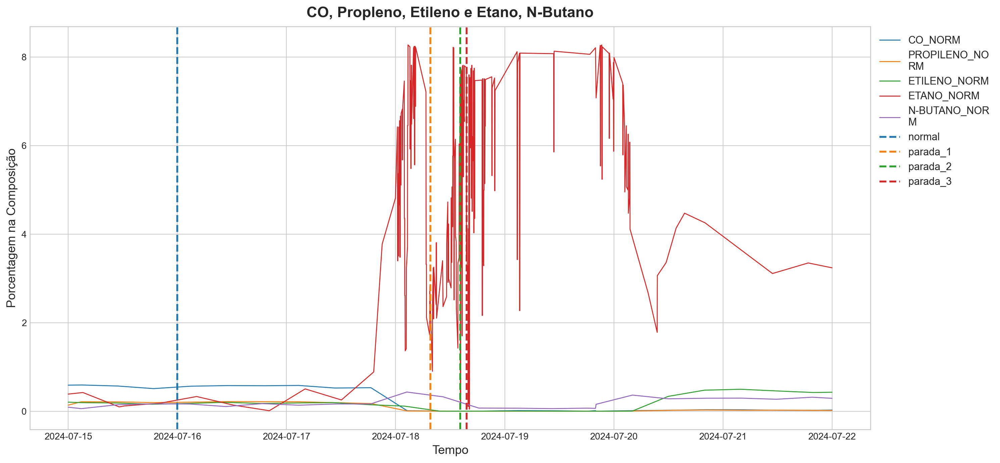

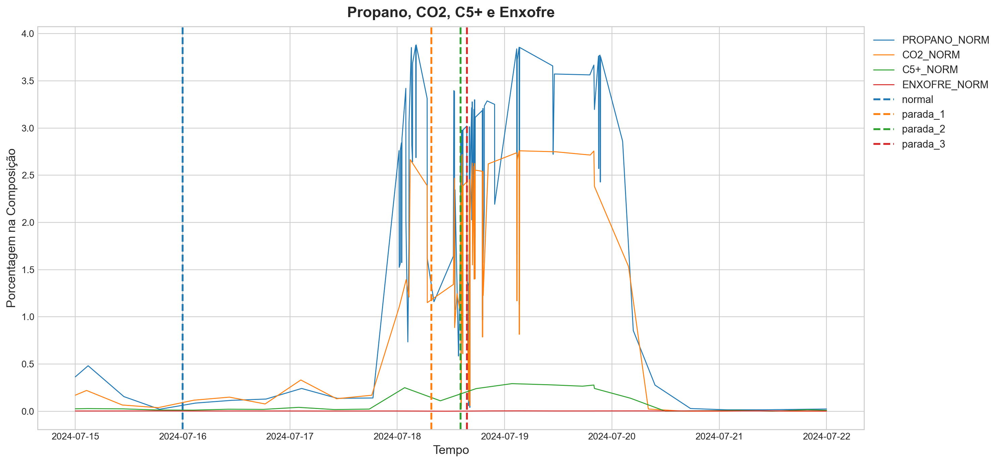

In [50]:
columns = [['H2_CROMATOGRAFO','ANALISADOR_DE_H2','H2_NORM', 'METANO_NORM'], 
           ['CO_NORM','PROPILENO_NORM','ETILENO_NORM','ETANO_NORM','N-BUTANO_NORM'],
           ['PROPANO_NORM','CO2_NORM','C5+_NORM','ENXOFRE_NORM']]
titles = ['H2 e Metano','CO, Propleno, Etileno e Etano, N-Butano','Propano, CO2, C5+ e Enxofre']
ylabels = ['Porcentagem na Composição','Porcentagem na Composição','Porcentagem na Composição']

for i, column in enumerate(columns):
    if isinstance(column, list):
        plot_data_cut_v(df.index[0], df.index[-1], df, column, titles[i], ylabels[i], cuts=cuts, cuts_names=cuts_names, greater=0)
    else:
        plot_data_cut_v(df.index[0], df.index[-1], df, [column], titles[i], ylabels[i], cuts=cuts, cuts_names=cuts_names, greater=0)

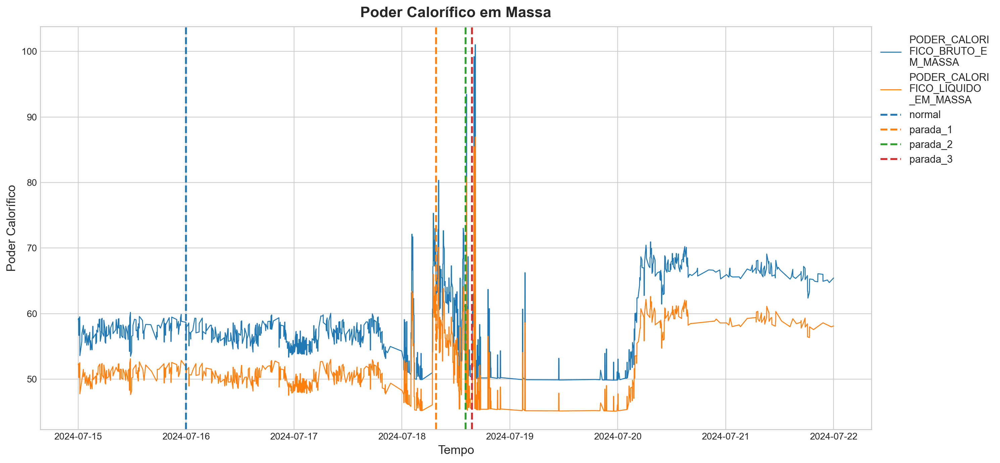

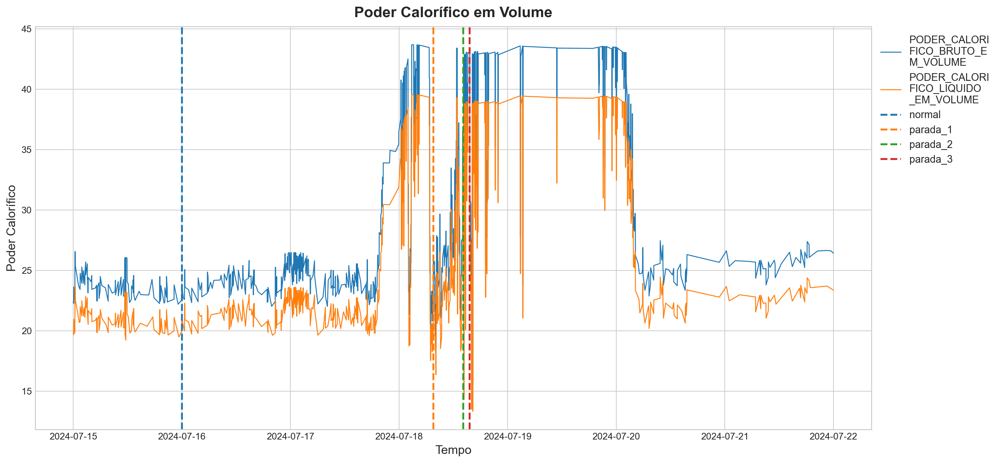

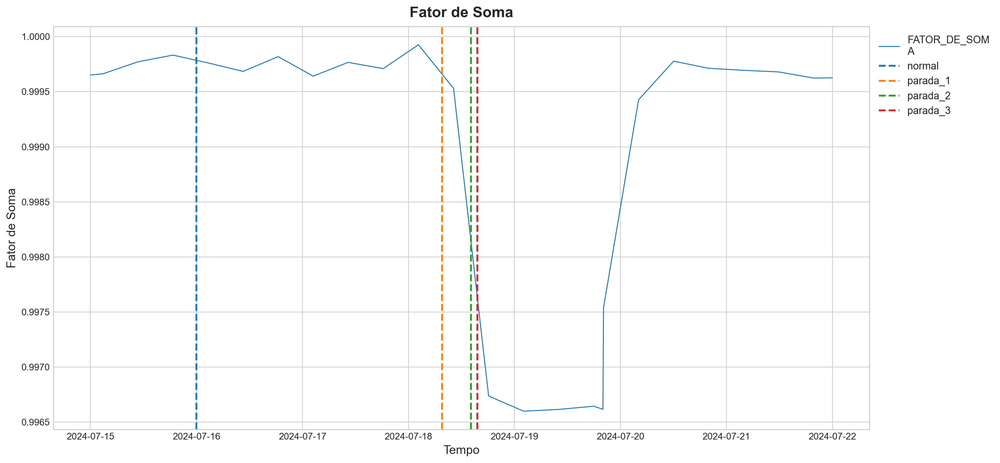

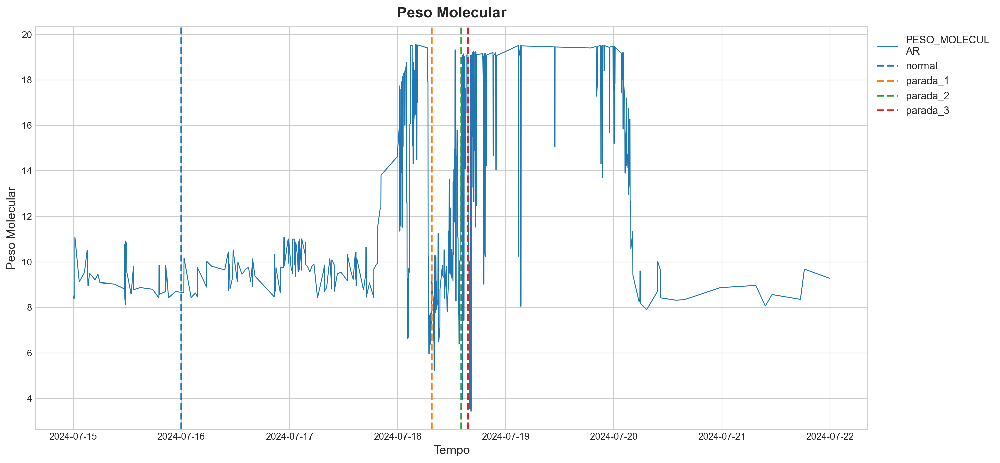

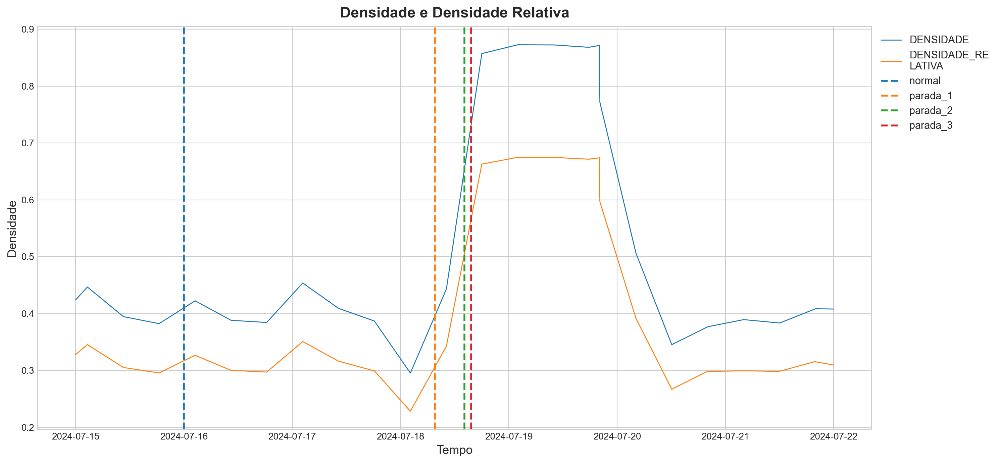

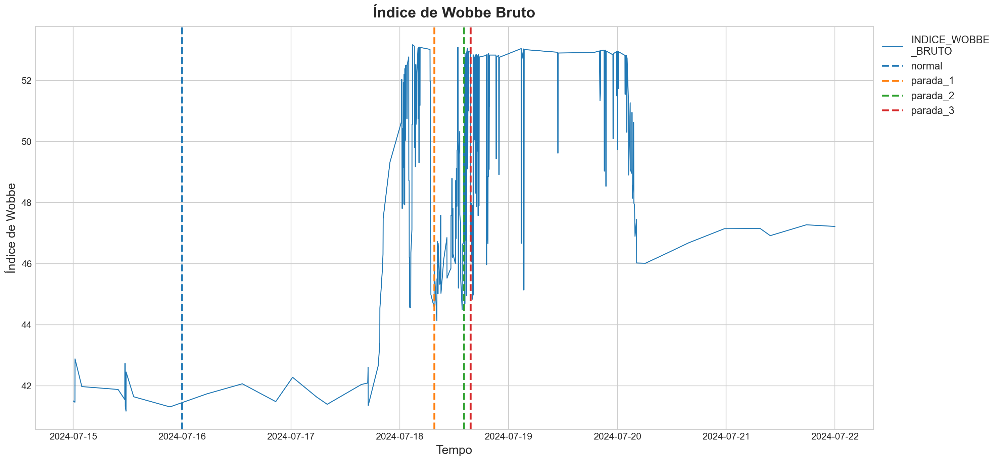

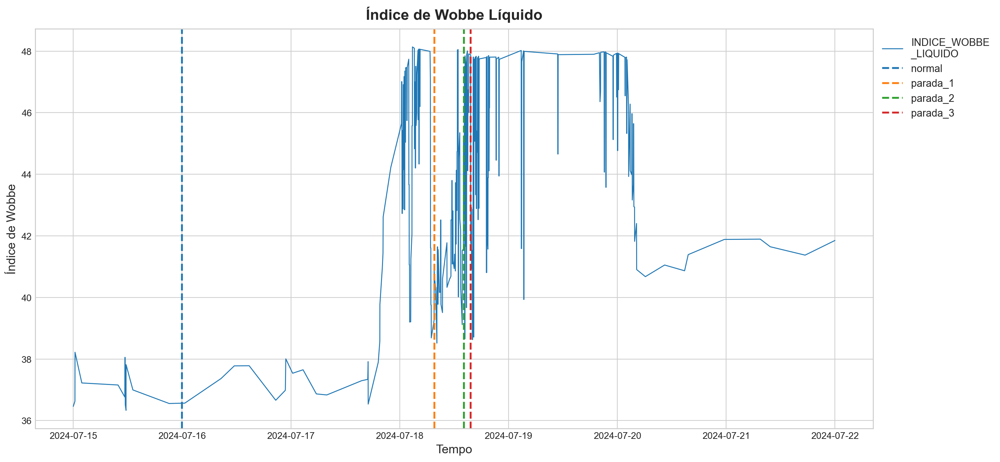

In [51]:
columns = [['PODER_CALORIFICO_BRUTO_EM_MASSA','PODER_CALORIFICO_LIQUIDO_EM_MASSA'],
           ['PODER_CALORIFICO_BRUTO_EM_VOLUME','PODER_CALORIFICO_LIQUIDO_EM_VOLUME'],
            'FATOR_DE_SOMA','PESO_MOLECULAR',['DENSIDADE','DENSIDADE_RELATIVA'],
            'INDICE_WOBBE_BRUTO','INDICE_WOBBE_LIQUIDO']
titles = ['Poder Calorífico em Massa','Poder Calorífico em Volume','Fator de Soma','Peso Molecular',
            'Densidade e Densidade Relativa','Índice de Wobbe Bruto', 'Índice de Wobbe Líquido']
ylabels = ['Poder Calorífico','Poder Calorífico','Fator de Soma','Peso Molecular',
            'Densidade','Índice de Wobbe','Índice de Wobbe']

for i, column in enumerate(columns):
    if isinstance(column, list):
        plot_data_cut_v(df.index[0], df.index[-1], df, column, titles[i], ylabels[i], cuts=cuts, cuts_names=cuts_names, greater=0)
    else:
        plot_data_cut_v(df.index[0], df.index[-1], df, [column], titles[i], ylabels[i], cuts=cuts, cuts_names=cuts_names, greater=0)